In [1]:
import tensorflow as tf



In [2]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time

from IPython import display

In [4]:
import json
import math
import os
import cv2
from PIL import Image
import numpy as np
from tensorflow.keras import layers
from tensorflow.keras.applications import DenseNet201
from keras.callbacks import Callback, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from keras.preprocessing.image import ImageDataGenerator
from keras.utils.np_utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score, accuracy_score
import scipy
from tqdm import tqdm
import tensorflow as tf
from tensorflow.keras import backend as K
import gc
from functools import partial
from sklearn import metrics
from collections import Counter
import json
import itertools

In [5]:
import os
os.chdir('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast')

In [6]:
!ls

DCGAN_generated_output count_files.sh         malignant
README.txt             initial_weights.h5
benign                 logs


In [7]:
def Dataset_loader(DIR, RESIZE, sigmaX=200):
    IMG = []
    read = lambda imname: np.asarray(Image.open(imname).convert("RGB"))
    for IMAGE_NAME in tqdm(os.listdir(DIR)):
        PATH = os.path.join(DIR,IMAGE_NAME)
        _, ftype = os.path.splitext(PATH)
        if ftype == ".png":
            img = read(PATH)
           
            img = cv2.resize(img, (RESIZE,RESIZE))
           
            IMG.append(np.array(img))
    return IMG

In [8]:
path=os.walk('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB')

In [9]:
benign=[]
for root,directories, files in path:
    
    for directory in directories:
        if directory=='100X'or directory=='200X'or directory=='400X'or directory=='40X':
            benign.append(np.array(Dataset_loader(root+'/'+directory,224)))
            print(root+'/'+directory)

 23%|██▎       | 7/30 [00:00<00:00, 63.46it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X


 21%|██        | 6/29 [00:00<00:00, 55.23it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/400X


 19%|█▉        | 6/32 [00:00<00:00, 57.24it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/40X


 18%|█▊        | 6/34 [00:00<00:00, 54.31it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/200X


 21%|██        | 6/29 [00:00<00:00, 55.33it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549G/100X


 17%|█▋        | 6/35 [00:00<00:00, 55.45it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549G/400X


 19%|█▉        | 6/32 [00:00<00:00, 54.81it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549G/40X


 19%|█▉        | 7/36 [00:00<00:00, 62.13it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549G/200X


 20%|██        | 6/30 [00:00<00:00, 57.52it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549CD/100X


 20%|██        | 7/35 [00:00<00:00, 60.57it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549CD/400X


 23%|██▎       | 7/31 [00:00<00:00, 64.64it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549CD/40X


 46%|████▌     | 6/13 [00:00<00:00, 58.27it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549CD/200X


 41%|████      | 7/17 [00:00<00:00, 68.44it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-29960CD/100X


 40%|████      | 6/15 [00:00<00:00, 58.82it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-29960CD/400X


 44%|████▍     | 7/16 [00:00<00:00, 67.75it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-29960CD/40X


 16%|█▌        | 6/37 [00:00<00:00, 58.41it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-29960CD/200X


 21%|██        | 6/29 [00:00<00:00, 56.82it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184CD/100X


 17%|█▋        | 6/35 [00:00<00:00, 56.37it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184CD/400X


 26%|██▌       | 6/23 [00:00<00:00, 56.22it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184CD/40X


 18%|█▊        | 6/34 [00:00<00:00, 56.12it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184CD/200X


 29%|██▉       | 7/24 [00:00<00:00, 61.43it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184/100X


 15%|█▌        | 6/39 [00:00<00:00, 57.87it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184/400X


 17%|█▋        | 6/35 [00:00<00:00, 58.72it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184/40X


 50%|█████     | 7/14 [00:00<00:00, 61.41it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184/200X


100%|██████████| 15/15 [00:00<00:00, 77.31it/s]


/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-13200/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-13200/400X


 33%|███▎      | 7/21 [00:00<00:00, 64.64it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-13200/40X


  0%|          | 0/15 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-13200/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-15275/100X


  0%|          | 0/12 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-15275/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-15275/40X


 50%|█████     | 9/18 [00:00<00:00, 89.51it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-15275/200X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-21978AB/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-21978AB/400X


100%|██████████| 17/17 [00:00<00:00, 87.34it/s]


/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-21978AB/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-21978AB/200X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-3411F/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-3411F/400X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-3411F/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-3411F/200X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-19854C/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-19854C/400X


100%|██████████| 16/16 [00:00<00:00, 82.59it/s]


/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-19854C/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-19854C/200X


  0%|          | 0/18 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-29960AB/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-29960AB/400X


100%|██████████| 18/18 [00:00<00:00, 91.71it/s]


/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-29960AB/40X


  0%|          | 0/18 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-29960AB/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23222AB/100X


  0%|          | 0/17 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23222AB/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23222AB/40X


 19%|█▉        | 6/31 [00:00<00:00, 56.24it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23222AB/200X


 19%|█▉        | 7/37 [00:00<00:00, 60.14it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134/100X


 17%|█▋        | 6/36 [00:00<00:00, 58.98it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134/400X


 18%|█▊        | 7/38 [00:00<00:00, 59.98it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134/40X


 17%|█▋        | 6/36 [00:00<00:00, 55.41it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134/200X


 27%|██▋       | 7/26 [00:00<00:00, 67.52it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-9133/100X


 23%|██▎       | 6/26 [00:00<00:00, 58.50it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-9133/400X


 18%|█▊        | 7/38 [00:00<00:00, 61.32it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-9133/40X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-9133/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060CD/100X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060CD/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060CD/40X


 19%|█▉        | 6/31 [00:00<00:00, 57.37it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060CD/200X


 19%|█▉        | 6/32 [00:00<00:00, 59.19it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998CD/100X


 16%|█▌        | 6/37 [00:00<00:00, 57.66it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998CD/400X


 19%|█▉        | 7/37 [00:00<00:00, 63.91it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998CD/40X


 18%|█▊        | 6/33 [00:00<00:00, 50.74it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998CD/200X


 18%|█▊        | 6/33 [00:00<00:00, 58.61it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-25197/100X


 27%|██▋       | 6/22 [00:00<00:00, 58.28it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-25197/400X


 19%|█▉        | 6/32 [00:00<00:00, 54.97it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-25197/40X


 18%|█▊        | 6/33 [00:00<00:00, 57.37it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-25197/200X


 21%|██▏       | 6/28 [00:00<00:00, 58.20it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998EF/100X


 23%|██▎       | 7/31 [00:00<00:00, 63.10it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998EF/400X


 21%|██        | 6/29 [00:00<00:00, 58.66it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998EF/40X


 19%|█▉        | 6/32 [00:00<00:00, 57.97it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998EF/200X


100%|██████████| 12/12 [00:00<00:00, 60.29it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134E/100X



 21%|██        | 6/29 [00:00<00:00, 56.84it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134E/400X


 29%|██▊       | 6/21 [00:00<00:00, 58.12it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134E/40X


 41%|████      | 9/22 [00:00<00:00, 87.99it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134E/200X


 50%|█████     | 9/18 [00:00<00:00, 84.89it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060AB/100X


 43%|████▎     | 10/23 [00:00<00:00, 94.79it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060AB/400X


 50%|█████     | 9/18 [00:00<00:00, 86.67it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060AB/40X


 15%|█▌        | 6/39 [00:00<00:00, 56.89it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060AB/200X


 15%|█▌        | 6/39 [00:00<00:00, 59.61it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-22704/100X


 16%|█▌        | 6/38 [00:00<00:00, 56.80it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-22704/400X


 14%|█▍        | 6/42 [00:00<00:00, 56.72it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-22704/40X


 11%|█         | 7/66 [00:00<00:00, 59.91it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-22704/200X


 12%|█▏        | 7/59 [00:00<00:00, 61.49it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-21998AB/100X


 10%|█         | 6/58 [00:00<00:00, 58.86it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-21998AB/400X


 12%|█▏        | 6/52 [00:00<00:00, 56.73it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-21998AB/40X


 38%|███▊      | 6/16 [00:00<00:00, 59.53it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-21998AB/200X


 47%|████▋     | 8/17 [00:00<00:00, 74.11it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-29315EF/100X


 54%|█████▍    | 7/13 [00:00<00:00, 62.19it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-29315EF/400X


 50%|█████     | 7/14 [00:00<00:00, 65.59it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-29315EF/40X


100%|██████████| 14/14 [00:00<00:00, 67.21it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-29315EF/200X


In [10]:
benign_final=np.array(list(itertools.chain.from_iterable(benign)))

In [11]:
benign_final.shape

(2480, 224, 224, 3)

In [12]:
path=os.walk('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB')

In [13]:
malignant=[]
for root,directories, files in path:
    
    for directory in directories:
        if directory=='100X'or directory=='200X'or directory=='400X'or directory=='40X':
            malignant.append(np.array(Dataset_loader(root+'/'+directory,224)))
            print(root+'/'+directory)

  0%|          | 0/15 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13418DE/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13418DE/400X


  0%|          | 0/50 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13418DE/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13418DE/200X


 17%|█▋        | 6/35 [00:00<00:00, 57.36it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-16456/100X


 13%|█▎        | 6/46 [00:00<00:00, 56.65it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-16456/400X


 13%|█▎        | 6/47 [00:00<00:00, 59.89it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-16456/40X


 28%|██▊       | 7/25 [00:00<00:00, 63.74it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-16456/200X


 33%|███▎      | 6/18 [00:00<00:00, 55.87it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-12773/100X


 23%|██▎       | 6/26 [00:00<00:00, 56.77it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-12773/400X


 29%|██▊       | 6/21 [00:00<00:00, 56.49it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-12773/40X


  0%|          | 0/15 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-12773/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979C/100X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979C/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979C/40X


 27%|██▋       | 6/22 [00:00<00:00, 57.34it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979C/200X


  0%|          | 0/15 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842/400X


 44%|████▍     | 7/16 [00:00<00:00, 61.98it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842/40X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842D/100X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842D/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842D/40X


 15%|█▍        | 6/41 [00:00<00:00, 54.91it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842D/200X


 23%|██▎       | 6/26 [00:00<00:00, 57.97it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13413/100X


 21%|██        | 6/29 [00:00<00:00, 52.68it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13413/400X


 26%|██▌       | 6/23 [00:00<00:00, 55.76it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13413/40X


 22%|██▏       | 6/27 [00:00<00:00, 54.19it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13413/200X


 25%|██▌       | 6/24 [00:00<00:00, 53.43it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979/100X


 23%|██▎       | 6/26 [00:00<00:00, 52.73it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979/400X


 29%|██▊       | 6/21 [00:00<00:00, 59.11it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979/40X


  0%|          | 0/15 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-10147/100X


  0%|          | 0/22 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-10147/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-10147/40X


  0%|          | 0/15 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-10147/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_15-190EF/100X


100%|██████████| 19/19 [00:00<00:00, 95.34it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_15-190EF/400X



  0%|          | 0/29 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_15-190EF/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_15-190EF/200X


 20%|██        | 7/35 [00:00<00:00, 61.08it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15704/100X


 20%|██        | 6/30 [00:00<00:00, 57.42it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15704/400X


 21%|██        | 7/33 [00:00<00:00, 59.50it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15704/40X


 16%|█▌        | 6/38 [00:00<00:00, 57.12it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15704/200X


 17%|█▋        | 6/36 [00:00<00:00, 57.62it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-19440/100X


 17%|█▋        | 6/35 [00:00<00:00, 49.73it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-19440/400X


 24%|██▍       | 8/33 [00:00<00:00, 72.75it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-19440/40X


 33%|███▎      | 7/21 [00:00<00:00, 68.03it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-19440/200X


  0%|          | 0/21 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-12465/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-12465/400X


 42%|████▏     | 8/19 [00:00<00:00, 72.63it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-12465/40X


  0%|          | 0/15 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-12465/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15687B/100X


  0%|          | 0/14 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15687B/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15687B/40X


 36%|███▋      | 8/22 [00:00<00:00, 70.29it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15687B/200X


 29%|██▉       | 7/24 [00:00<00:00, 69.63it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-9146/100X


 30%|███       | 7/23 [00:00<00:00, 66.48it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-9146/400X


 38%|███▊      | 8/21 [00:00<00:00, 71.40it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-9146/40X


 28%|██▊       | 7/25 [00:00<00:00, 65.27it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-9146/200X


 35%|███▌      | 7/20 [00:00<00:00, 66.09it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11951/100X


 26%|██▌       | 7/27 [00:00<00:00, 69.56it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11951/400X


 29%|██▊       | 8/28 [00:00<00:00, 70.26it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11951/40X


  0%|          | 0/9 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11951/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-8168/100X


  0%|          | 0/9 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-8168/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-8168/40X


 17%|█▋        | 7/41 [00:00<00:00, 66.44it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-8168/200X


 21%|██        | 8/38 [00:00<00:00, 77.37it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-12312/100X


 22%|██▏       | 7/32 [00:00<00:00, 69.18it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-12312/400X


 20%|██        | 7/35 [00:00<00:00, 69.02it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-12312/40X


  0%|          | 0/15 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-12312/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15792/100X


  0%|          | 0/12 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15792/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15792/40X


 37%|███▋      | 7/19 [00:00<00:00, 69.93it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15792/200X


 30%|███       | 7/23 [00:00<00:00, 69.86it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16188/100X


 29%|██▉       | 7/24 [00:00<00:00, 62.44it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16188/400X


 33%|███▎      | 7/21 [00:00<00:00, 63.68it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16188/40X


  0%|          | 0/14 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16188/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2985/100X


 35%|███▌      | 7/20 [00:00<00:00, 64.06it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2985/400X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2985/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2985/200X


100%|██████████| 16/16 [00:00<00:00, 80.72it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17915/100X



 31%|███       | 8/26 [00:00<00:00, 72.88it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17915/400X


 43%|████▎     | 9/21 [00:00<00:00, 84.90it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17915/40X


 27%|██▋       | 7/26 [00:00<00:00, 63.26it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17915/200X


 29%|██▊       | 8/28 [00:00<00:00, 75.32it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17901/100X


 27%|██▋       | 7/26 [00:00<00:00, 66.61it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17901/400X


 33%|███▎      | 8/24 [00:00<00:00, 70.05it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17901/40X


 37%|███▋      | 7/19 [00:00<00:00, 66.31it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17901/200X


 44%|████▍     | 7/16 [00:00<00:00, 66.91it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14926/100X


 35%|███▌      | 7/20 [00:00<00:00, 63.86it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14926/400X


 39%|███▉      | 7/18 [00:00<00:00, 67.85it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14926/40X


 32%|███▏      | 7/22 [00:00<00:00, 68.20it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14926/200X


  0%|          | 0/14 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16875/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16875/400X


 47%|████▋     | 8/17 [00:00<00:00, 71.60it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16875/40X


 30%|███       | 7/23 [00:00<00:00, 66.10it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16875/200X


100%|██████████| 15/15 [00:00<00:00, 75.26it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15696/100X



 30%|███       | 7/23 [00:00<00:00, 68.39it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15696/400X


 32%|███▏      | 7/22 [00:00<00:00, 66.99it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15696/40X


  0%|          | 0/15 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15696/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16448/100X


  0%|          | 0/13 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16448/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16448/40X


  0%|          | 0/9 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16448/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-10926/100X


  0%|          | 0/9 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-10926/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-10926/40X


 36%|███▋      | 8/22 [00:00<00:00, 71.35it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-10926/200X


 28%|██▊       | 8/29 [00:00<00:00, 74.44it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-18650/100X


 24%|██▍       | 7/29 [00:00<00:00, 62.23it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-18650/400X


 25%|██▌       | 7/28 [00:00<00:00, 67.48it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-18650/40X


 19%|█▉        | 7/37 [00:00<00:00, 69.77it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-18650/200X


 32%|███▏      | 7/22 [00:00<00:00, 67.21it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20636/100X


 32%|███▏      | 8/25 [00:00<00:00, 73.31it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20636/400X


 30%|██▉       | 8/27 [00:00<00:00, 71.38it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20636/40X


 32%|███▏      | 7/22 [00:00<00:00, 69.00it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20636/200X


 33%|███▎      | 8/24 [00:00<00:00, 76.33it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4372/100X


 38%|███▊      | 8/21 [00:00<00:00, 70.74it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4372/400X


 41%|████      | 7/17 [00:00<00:00, 68.78it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4372/40X


 37%|███▋      | 7/19 [00:00<00:00, 67.21it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4372/200X


  0%|          | 0/13 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16336/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16336/400X


 47%|████▋     | 9/19 [00:00<00:00, 80.22it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16336/40X


 23%|██▎       | 6/26 [00:00<00:00, 57.29it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16336/200X


  0%|          | 0/26 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-3909/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-3909/400X


 24%|██▍       | 7/29 [00:00<00:00, 68.84it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-3909/40X


 24%|██▍       | 8/33 [00:00<00:00, 73.14it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-3909/200X


 31%|███       | 8/26 [00:00<00:00, 79.42it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13412/100X


 28%|██▊       | 9/32 [00:00<00:00, 80.94it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13412/400X


 25%|██▌       | 8/32 [00:00<00:00, 76.05it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13412/40X


  0%|          | 0/8 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13412/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4364/100X


 28%|██▊       | 7/25 [00:00<00:00, 68.03it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4364/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4364/40X


 29%|██▊       | 6/21 [00:00<00:00, 51.69it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4364/200X


 30%|███       | 7/23 [00:00<00:00, 61.13it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5287/100X


 26%|██▌       | 6/23 [00:00<00:00, 57.12it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5287/400X


 29%|██▊       | 6/21 [00:00<00:00, 57.22it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5287/40X


 18%|█▊        | 6/33 [00:00<00:00, 52.61it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5287/200X


 33%|███▎      | 8/24 [00:00<00:00, 71.76it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20629/100X


 22%|██▏       | 8/36 [00:00<00:00, 73.14it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20629/400X


 19%|█▉        | 6/32 [00:00<00:00, 53.03it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20629/40X


 17%|█▋        | 6/36 [00:00<00:00, 59.87it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20629/200X


 24%|██▍       | 7/29 [00:00<00:00, 67.30it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16716/100X


 18%|█▊        | 7/38 [00:00<00:00, 62.59it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16716/400X


 21%|██        | 7/34 [00:00<00:00, 67.16it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16716/40X


 22%|██▏       | 6/27 [00:00<00:00, 54.68it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16716/200X


 30%|███       | 6/20 [00:00<00:00, 57.27it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14015/100X


 39%|███▉      | 7/18 [00:00<00:00, 67.50it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14015/400X


 20%|██        | 6/30 [00:00<00:00, 55.60it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14015/40X


  0%|          | 0/13 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14015/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16601/100X


 50%|█████     | 6/12 [00:00<00:00, 55.93it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16601/400X


  0%|          | 0/23 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16601/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16601/200X


 25%|██▌       | 6/24 [00:00<00:00, 56.06it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2523/100X


  0%|          | 0/18 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2523/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2523/40X


 15%|█▍        | 6/41 [00:00<00:00, 58.32it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2523/200X


 16%|█▌        | 6/38 [00:00<00:00, 59.08it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2773/100X


 20%|██        | 6/30 [00:00<00:00, 55.17it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2773/400X


 17%|█▋        | 6/35 [00:00<00:00, 55.37it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2773/40X


 24%|██▍       | 6/25 [00:00<00:00, 56.56it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2773/200X


 39%|███▉      | 7/18 [00:00<00:00, 61.22it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2980/100X


 30%|███       | 6/20 [00:00<00:00, 53.34it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2980/400X


 29%|██▊       | 6/21 [00:00<00:00, 54.54it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2980/40X


 41%|████      | 7/17 [00:00<00:00, 63.08it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2980/200X


 47%|████▋     | 7/15 [00:00<00:00, 65.18it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11031/100X


 50%|█████     | 7/14 [00:00<00:00, 62.07it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11031/400X


 43%|████▎     | 6/14 [00:00<00:00, 59.79it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11031/40X


 17%|█▋        | 7/42 [00:00<00:00, 62.43it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11031/200X


 25%|██▌       | 8/32 [00:00<00:00, 75.59it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13993/100X


 19%|█▉        | 7/37 [00:00<00:00, 65.79it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13993/400X


 21%|██        | 7/34 [00:00<00:00, 69.34it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13993/40X


 22%|██▏       | 7/32 [00:00<00:00, 65.94it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13993/200X


 21%|██        | 7/34 [00:00<00:00, 63.23it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14946/100X


 23%|██▎       | 7/31 [00:00<00:00, 60.37it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14946/400X


 21%|██        | 7/34 [00:00<00:00, 61.22it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14946/40X


 26%|██▌       | 6/23 [00:00<00:00, 55.82it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14946/200X


 40%|████      | 6/15 [00:00<00:00, 57.83it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15572/100X


 26%|██▌       | 6/23 [00:00<00:00, 56.60it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15572/400X


 32%|███▏      | 6/19 [00:00<00:00, 57.20it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15572/40X


 29%|██▊       | 6/21 [00:00<00:00, 54.37it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15572/200X


 23%|██▎       | 6/26 [00:00<00:00, 55.05it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5694/100X


 27%|██▋       | 6/22 [00:00<00:00, 54.62it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5694/400X


 29%|██▊       | 6/21 [00:00<00:00, 54.42it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5694/40X


 29%|██▊       | 6/21 [00:00<00:00, 59.10it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5694/200X


 46%|████▌     | 6/13 [00:00<00:00, 57.22it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-6241/100X


 19%|█▉        | 6/32 [00:00<00:00, 54.28it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-6241/400X


 50%|█████     | 6/12 [00:00<00:00, 55.81it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-6241/40X


 23%|██▎       | 6/26 [00:00<00:00, 55.80it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-6241/200X


 30%|███       | 7/23 [00:00<00:00, 59.92it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11520/100X


 24%|██▍       | 6/25 [00:00<00:00, 54.23it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11520/400X


 25%|██▌       | 6/24 [00:00<00:00, 57.74it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11520/40X


 29%|██▊       | 6/21 [00:00<00:00, 54.90it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11520/200X


 29%|██▉       | 7/24 [00:00<00:00, 65.06it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5695/100X


 26%|██▌       | 6/23 [00:00<00:00, 53.88it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5695/400X


 27%|██▋       | 6/22 [00:00<00:00, 55.92it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5695/40X


 21%|██        | 6/29 [00:00<00:00, 56.87it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5695/200X


 21%|██▏       | 6/28 [00:00<00:00, 57.82it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17614/100X


 15%|█▌        | 6/39 [00:00<00:00, 51.22it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17614/400X


 18%|█▊        | 6/33 [00:00<00:00, 56.19it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17614/40X


 17%|█▋        | 6/36 [00:00<00:00, 55.52it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17614/200X


 23%|██▎       | 7/31 [00:00<00:00, 62.10it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-9461/100X


 38%|███▊      | 10/26 [00:00<00:00, 93.62it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-9461/400X


 11%|█▏        | 7/62 [00:00<00:00, 60.11it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-9461/40X


 41%|████      | 7/17 [00:00<00:00, 62.49it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-9461/200X


 41%|████      | 7/17 [00:00<00:00, 66.09it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-16196/100X


 32%|███▏      | 7/22 [00:00<00:00, 66.68it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-16196/400X


 39%|███▉      | 7/18 [00:00<00:00, 60.92it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-16196/40X


 18%|█▊        | 6/33 [00:00<00:00, 57.14it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-16196/200X


 31%|███       | 8/26 [00:00<00:00, 69.44it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-13412/100X


 19%|█▉        | 6/32 [00:00<00:00, 59.48it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-13412/400X


 22%|██▏       | 7/32 [00:00<00:00, 60.74it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-13412/40X


 11%|█         | 6/54 [00:00<00:00, 55.82it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-13412/200X


 17%|█▋        | 7/41 [00:00<00:00, 61.43it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570/100X


 12%|█▏        | 6/51 [00:00<00:00, 55.48it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570/400X


 11%|█         | 6/55 [00:00<00:00, 56.16it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570/40X


 17%|█▋        | 6/35 [00:00<00:00, 56.95it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570/200X


 21%|██        | 6/29 [00:00<00:00, 59.86it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570C/100X


 19%|█▉        | 6/31 [00:00<00:00, 53.32it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570C/400X


 20%|██        | 6/30 [00:00<00:00, 57.03it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570C/40X


 19%|█▉        | 6/31 [00:00<00:00, 56.15it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570C/200X


 25%|██▌       | 6/24 [00:00<00:00, 57.77it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-12204/100X


 30%|███       | 6/20 [00:00<00:00, 54.99it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-12204/400X


 21%|██▏       | 6/28 [00:00<00:00, 59.58it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-12204/40X


100%|██████████| 28/28 [00:00<00:00, 57.71it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-12204/200X


In [14]:
malignant_final=np.array(list(itertools.chain.from_iterable(malignant)))

In [15]:
malignant_final.shape

(5429, 224, 224, 3)

In [16]:
benign_label = np.zeros(len(benign_final))
malign_label = np.ones(len(malignant_final))

In [17]:
X=np.concatenate((benign_final, malignant_final), axis = 0)

In [18]:
Y=np.concatenate((benign_label, malign_label), axis = 0)

In [19]:
from sklearn.model_selection import train_test_split

In [20]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

In [21]:
pd.DataFrame(Y_test)[0].value_counts()

1.0    1763
0.0     847
Name: 0, dtype: int64

In [22]:
pd.DataFrame(Y_train)[0].value_counts()

1.0    3666
0.0    1633
Name: 0, dtype: int64

In [23]:
s = np.arange(X_train.shape[0])
np.random.shuffle(s)
X_train = X_train[s]
Y_train = Y_train[s]

s = np.arange(X_test.shape[0])
np.random.shuffle(s)
X_test = X_test[s]
Y_test = Y_test[s]

Y_train = to_categorical(Y_train, num_classes= 2)
Y_test = to_categorical(Y_test, num_classes= 2)

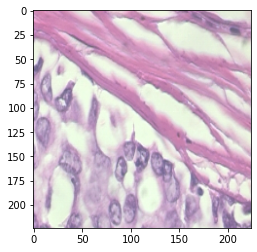

In [24]:
plt.imshow(X_train[0])

In [25]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 64
EPOCHS = 200

In [26]:
val_samples = 2000
x_val, y_val = X_train[:val_samples], Y_train[:val_samples]
new_x_train, new_y_train = X_train[val_samples:], Y_train[val_samples:]



In [27]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 64
EPOCHS = 10

val_samples = 2000
x_val, y_val = X_train[:val_samples], Y_train[:val_samples]
new_x_train, new_y_train = X_train[val_samples:], Y_train[val_samples:]



In [28]:
BATCH_SIZE = 16

train_generator = ImageDataGenerator(
        zoom_range=2,  # set range for random zoom
        rotation_range = 90,
        horizontal_flip=True,  # randomly flip images
        vertical_flip=True,  # randomly flip images
        shear_range=0.7,
        brightness_range=[0.2,0.6]
    )

# Support Vector Machine

In [29]:
X_train.shape

(5299, 224, 224, 3)

In [30]:
import numpy as np

def rgb2gray(rgb):

    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

    return gray

In [31]:
X_train_gray=[rgb2gray(l) for l in X_train]

In [32]:
X_train_gray=np.array(X_train_gray)

In [33]:
d1, d2, d3 = X_train_gray.shape

In [34]:
x_data_reshaped = X_train_gray.reshape((d1, d2*d3))


In [35]:
x_data_reshaped.shape

(4367, 50176)

In [36]:
Y_train.shape

(4367, 2)

In [37]:
X_train_gray.shape

(4367, 224, 224)

In [38]:
y_train_svm=np.array(pd.DataFrame(Y_train)[0])

In [39]:
from sklearn.svm import SVC
svc = SVC(kernel='linear',gamma='auto')
svc.fit(x_data_reshaped, y_train_svm)

SVC(gamma='auto', kernel='linear')

In [40]:
X_test_gray=[rgb2gray(l) for l in X_test]

In [41]:
X_test_gray=np.array(X_test_gray)

In [42]:
d1, d2, d3 = X_test_gray.shape

In [43]:
x_test_reshaped = X_test_gray.reshape((d1, d2*d3))



In [ ]:
y2 = svc.predict(x_test_reshaped)

In [ ]:
print("Classification report for classifier %s:\n%s\n"
      % (svc, metrics.classification_report(np.array(pd.DataFrame(Y_test)[0]), y2)))

# Random Forest Classification

In [63]:
from sklearn.ensemble import RandomForestClassifier

In [64]:
x_trainrf, x_testrf, y_train_rf, y_test_rf = train_test_split(X_train,Y_train, test_size = 0.3, random_state = 2)


In [65]:
rf = RandomForestClassifier()


In [67]:
rf.fit(x_data_reshaped, y_train_svm)

RandomForestClassifier()

In [68]:
y_pred_train = rf.predict(x_test_reshaped)

In [69]:
print("Classification report for classifier %s:\n%s\n"
      % (svc, metrics.classification_report(np.array(pd.DataFrame(Y_test)[0]), y_pred_train)))

Classification report for classifier SVC(gamma='auto', kernel='linear'):
              precision    recall  f1-score   support

         0.0       0.65      0.91      0.76      1320
         1.0       0.62      0.24      0.34       832

    accuracy                           0.65      2152
   macro avg       0.64      0.57      0.55      2152
weighted avg       0.64      0.65      0.60      2152




# Naive Bayse Classification

In [70]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(x_data_reshaped, y_train_svm)
  

GaussianNB()

In [71]:

# making predictions on the testing set
y_pred = gnb.predict(x_test_reshaped)

In [72]:
print("Classification report for classifier %s:\n%s\n"
      % (svc, metrics.classification_report(np.array(pd.DataFrame(Y_test)[0]), y_pred)))

Classification report for classifier SVC(gamma='auto', kernel='linear'):
              precision    recall  f1-score   support

         0.0       0.70      0.49      0.58      1320
         1.0       0.45      0.67      0.54       832

    accuracy                           0.56      2152
   macro avg       0.58      0.58      0.56      2152
weighted avg       0.61      0.56      0.56      2152




# Artificial Neural Network

In [30]:
from keras.layers.core import Dense
from tensorflow.keras.optimizers import SGD

In [42]:
model = Sequential()   
model=tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224,224,3)),
    tf.keras.layers.Dense(512,activation='relu'),
    tf.keras.layers.Dense(256,activation='relu'),
    tf.keras.layers.Dense(128,activation='relu'),
    tf.keras.layers.Dense(2,activation='softmax')
])

In [43]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_3 (Flatten)          (None, 150528)            0         
_________________________________________________________________
dense_18 (Dense)             (None, 512)               77070848  
_________________________________________________________________
dense_19 (Dense)             (None, 256)               131328    
_________________________________________________________________
dense_20 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_21 (Dense)             (None, 2)                 258       
Total params: 77,235,330
Trainable params: 77,235,330
Non-trainable params: 0
_________________________________________________________________


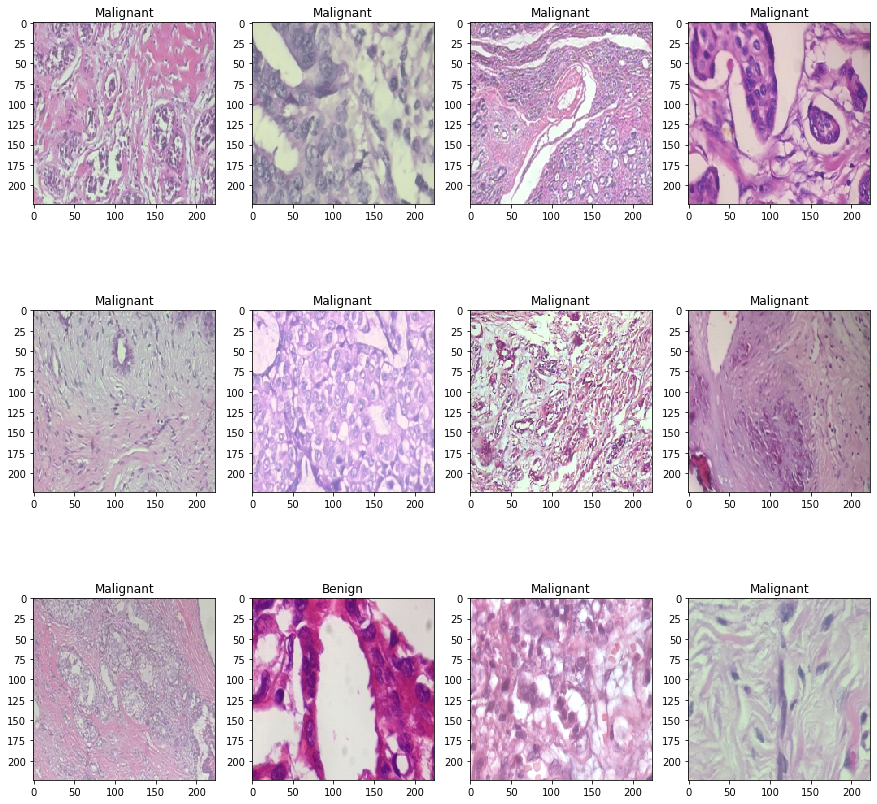

In [34]:
x_train, x_val, y_train, y_val = train_test_split(
    X_train, Y_train, 
    test_size=0.2, 
    random_state=11
)

w=60
h=40
fig=plt.figure(figsize=(15, 15))
columns = 4
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    if np.argmax(Y_train[i]) == 0:
        ax.title.set_text('Benign')
    else:
        ax.title.set_text('Malignant')
    plt.imshow(x_train[i], interpolation='nearest')
plt.show()

In [45]:
INIT_LR = 0.01
EPOCHS = 60
 
# compile the model using SGD as our optimizer and categorical cross-entropy loss
# (you'll want to use binary_crossentropy for 2-class classification)
print("[INFO] training network...")
opt = SGD(lr=INIT_LR)   # Stochastic Gradient Descent (SGD) optimizer
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

[INFO] training network...


/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [46]:
X_train.shape

(4367, 224, 224, 3)

In [47]:
Y_train.shape

(4367, 2)

In [48]:
INIT_LR = 0.01
EPOCHS = 60
 
# compile the model using SGD as our optimizer and categorical cross-entropy loss
# (you'll want to use binary_crossentropy for 2-class classification)
print("[INFO] training network...")
opt = SGD(lr=INIT_LR)   # Stochastic Gradient Descent (SGD) optimizer
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

[INFO] training network...


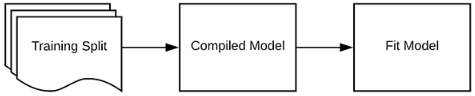

In [299]:
time1 = time.time()   # to measure time taken
H = model.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=EPOCHS, batch_size=32)
print('Time taken: {:.1f} seconds'.format(time.time() - time1))   # to measure time taken

Epoch 1/60
168/168 [==============================] - 8s 47ms/step - loss: 1.1747 - accuracy: 0.5903 - val_loss: 0.6721 - val_accuracy: 0.6134
Epoch 2/60
168/168 [==============================] - 8s 47ms/step - loss: 0.6741 - accuracy: 0.5998 - val_loss: 0.6683 - val_accuracy: 0.6134
Epoch 3/60
168/168 [==============================] - 8s 49ms/step - loss: 0.6732 - accuracy: 0.5998 - val_loss: 0.6676 - val_accuracy: 0.6134
Epoch 4/60
168/168 [==============================] - 8s 45ms/step - loss: 0.6732 - accuracy: 0.5998 - val_loss: 0.6677 - val_accuracy: 0.6134
Epoch 5/60
168/168 [==============================] - 8s 45ms/step - loss: 0.6732 - accuracy: 0.5998 - val_loss: 0.6678 - val_accuracy: 0.6134
Epoch 6/60
168/168 [==============================] - 7s 44ms/step - loss: 0.6732 - accuracy: 0.5998 - val_loss: 0.6676 - val_accuracy: 0.6134
Epoch 7/60
168/168 [==============================] - 7s 44ms/step - loss: 0.6732 - accuracy: 0.5998 - val_loss: 0.6675 - val_accuracy: 0.6134

In [49]:
time1 = time.time()   # to measure time taken
H = model.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=20, batch_size=32)
print('Time taken: {:.1f} seconds'.format(time.time() - time1))   # to measure time taken

Epoch 1/20
137/137 [==============================] - 26s 188ms/step - loss: nan - accuracy: 0.3824 - val_loss: nan - val_accuracy: 0.3866
Epoch 2/20
137/137 [==============================] - 25s 184ms/step - loss: nan - accuracy: 0.3774 - val_loss: nan - val_accuracy: 0.3866
Epoch 3/20
137/137 [==============================] - 26s 193ms/step - loss: nan - accuracy: 0.3774 - val_loss: nan - val_accuracy: 0.3866
Epoch 4/20
137/137 [==============================] - 24s 176ms/step - loss: nan - accuracy: 0.3774 - val_loss: nan - val_accuracy: 0.3866
Epoch 5/20
137/137 [==============================] - 24s 175ms/step - loss: nan - accuracy: 0.3774 - val_loss: nan - val_accuracy: 0.3866
Epoch 6/20
137/137 [==============================] - 24s 177ms/step - loss: nan - accuracy: 0.3774 - val_loss: nan - val_accuracy: 0.3866
Epoch 7/20
137/137 [==============================] - 26s 187ms/step - loss: nan - accuracy: 0.3774 - val_loss: nan - val_accuracy: 0.3866
Epoch 8/20
137/137 [=======

# Convolutional Neural Network

In [35]:
def build_model(backbone, lr=1e-4):
    model = Sequential()
    model.add(backbone)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(2, activation='softmax'))
    
    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(lr=lr),
        metrics=['accuracy']
    )
    return model

resnet = DenseNet201(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

model = build_model(resnet ,lr = 1e-4)
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet201 (Functional)     (None, 7, 7, 1920)        18321984  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1920)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1920)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 1920)              7680      
_________________________________________________________________
dense (Dense)                (None, 2)                 3842      
Total params: 18,333,506
Trainable params: 18,100,610
Non-trainable params: 232,896
_________________________________________________________________


/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [146]:
learn_control = ReduceLROnPlateau(monitor='val_acc', patience=5,
                                  verbose=1,factor=0.2, min_lr=1e-7)

filepath="weights.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

history = model.fit_generator(
    train_generator.flow(x_train, y_train, batch_size=BATCH_SIZE),
    steps_per_epoch=x_train.shape[0] / BATCH_SIZE,
    epochs=20,
    validation_data=(x_val, y_val),
    callbacks=[learn_control, checkpoint]
)

Epoch 1/20
218/218 [==============================] - 1950s 9s/step - loss: 0.4849 - accuracy: 0.7902 - val_loss: 0.3180 - val_accuracy: 0.8856
Epoch 2/20
218/218 [==============================] - 2006s 9s/step - loss: 0.3606 - accuracy: 0.8549 - val_loss: 0.2078 - val_accuracy: 0.9279
Epoch 3/20
218/218 [==============================] - 1916s 9s/step - loss: 0.3250 - accuracy: 0.8737 - val_loss: 0.5171 - val_accuracy: 0.7574
Epoch 4/20
218/218 [==============================] - 1991s 9s/step - loss: 0.3043 - accuracy: 0.8760 - val_loss: 0.3020 - val_accuracy: 0.8833
Epoch 5/20
218/218 [==============================] - 1824s 8s/step - loss: 0.2718 - accuracy: 0.8895 - val_loss: 0.4220 - val_accuracy: 0.8135
Epoch 6/20
218/218 [==============================] - 1798s 8s/step - loss: 0.2847 - accuracy: 0.8835 - val_loss: 0.3132 - val_accuracy: 0.8890
Epoch 7/20
218/218 [==============================] - 2147s 10s/step - loss: 0.2685 - accuracy: 0.8972 - val_loss: 0.3871 - val_accuracy

<AxesSubplot:>

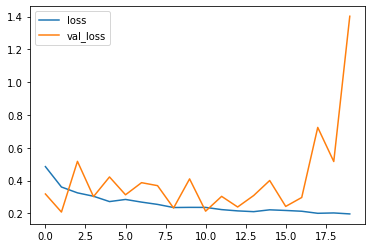

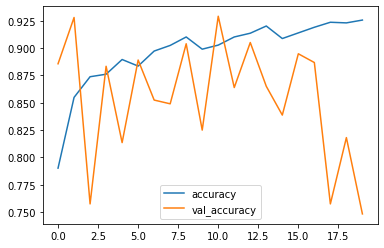

In [147]:
history_df = pd.DataFrame(history.history)
history_df[['loss', 'val_loss']].plot()

history_df = pd.DataFrame(history.history)
history_df[['accuracy', 'val_accuracy']].plot()

In [148]:
y_pred=model.predict(X_test)

In [149]:
from sklearn.metrics import classification_report
classification_report( np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))



'              precision    recall  f1-score   support\n\n           0       1.00      0.34      0.50       832\n           1       0.70      1.00      0.83      1320\n\n    accuracy                           0.74      2152\n   macro avg       0.85      0.67      0.66      2152\nweighted avg       0.82      0.74      0.70      2152\n'

In [150]:

print(classification_report( np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1)))

              precision    recall  f1-score   support

           0       1.00      0.34      0.50       832
           1       0.70      1.00      0.83      1320

    accuracy                           0.74      2152
   macro avg       0.85      0.67      0.66      2152
weighted avg       0.82      0.74      0.70      2152



Confusion matrix, without normalization
[[ 279  553]
 [   1 1319]]


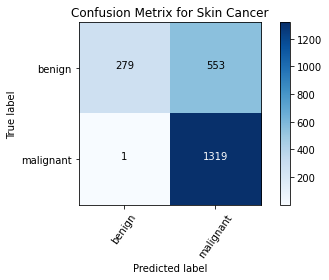

In [151]:

from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=55)
    plt.yticks(tick_marks, classes)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

cm = confusion_matrix(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))

cm_plot_label =['benign', 'malignant']
plot_confusion_matrix(cm, cm_plot_label, title ='Confusion Metrix for Skin Cancer')

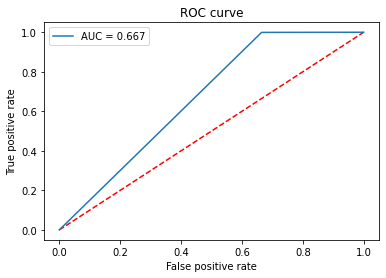

In [152]:
from sklearn.metrics import roc_auc_score, auc
from sklearn.metrics import roc_curve
roc_log = roc_auc_score(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
false_positive_rate, true_positive_rate, threshold = roc_curve(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
area_under_curve = auc(false_positive_rate, true_positive_rate)

plt.plot([0, 1], [0, 1], 'r--')
plt.plot(false_positive_rate, true_positive_rate, label='AUC = {:.3f}'.format(area_under_curve))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()
#plt.savefig(ROC_PLOT_FILE, bbox_inches='tight')
plt.close()

In [154]:
from tensorflow import keras

In [155]:
model.save('/Users/ssing623/Documents/B Cancer/model2')

INFO:tensorflow:Assets written to: /Users/ssing623/Documents/B Cancer/model2/assets


# Mixup Augmentation

In [ ]:
# benign_train=benign_final[0:2000]

# benign_test=benign_final[2000:]

# malign_train=malignant_final[0:2000]

# malign_test=malignant_final[2000:]

In [205]:
X_train

array([[[[184, 109, 150],
         [188,  99, 158],
         [187,  93, 154],
         ...,
         [154,  71, 140],
         [182,  92, 159],
         [145,  65, 131]],

        [[182, 107, 148],
         [189,  99, 160],
         [186,  95, 159],
         ...,
         [108,  35, 101],
         [150,  71, 135],
         [171,  93, 147]],

        [[179, 101, 144],
         [184,  94, 155],
         [185,  93, 156],
         ...,
         [106,  33,  99],
         [ 94,  20,  87],
         [173, 104, 150]],

        ...,

        [[181, 100, 156],
         [175,  91, 162],
         [152,  76, 156],
         ...,
         [161,  62, 134],
         [156,  65, 129],
         [150,  79, 135]],

        [[173,  94, 148],
         [173,  91, 160],
         [174,  96, 173],
         ...,
         [175,  70, 145],
         [164,  62, 139],
         [146,  65, 131]],

        [[167,  92, 142],
         [184, 102, 166],
         [208, 126, 202],
         ...,
         [180,  74, 148],
        

In [206]:
Y_train

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [0., 1.],
       [0., 1.],
       [1., 0.]], dtype=float32)

In [220]:
pd.DataFrame(Y_train)[0].value_counts()

0.0    2719
1.0    1648
Name: 0, dtype: int64

In [221]:
benign_train=np.array([X_train[x] for x in range(0,len(X_train)) if Y_train[x][0]==1])

In [223]:
malign_train=np.array([X_train[x] for x in range(0,len(X_train)) if Y_train[x][0]==0])

In [224]:
benign_test=np.array([X_test[x] for x in range(0,len(X_test)) if Y_test[x][0]==1])

In [225]:
malign_test=np.array([X_test[x] for x in range(0,len(X_test)) if Y_test[x][0]==0])

In [226]:
from numpy import random


In [227]:
malign_train.shape

(2719, 224, 224, 3)

In [234]:
ben_rand=random.randint(benign_train.shape[0])

In [235]:
mal_rand=random.randint(malign_train.shape[0])

In [236]:
malig_new=0.2*benign_train[ben_rand]+0.8*malign_train[mal_rand]

In [237]:
malig_new = tf.cast(malig_new, tf.float32)
malig_new=malig_new / 255.0

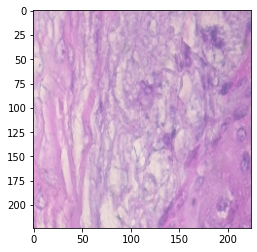

In [238]:
plt.imshow(malig_new)

In [239]:
malig=[]
for i in range(0,500):
    ben_rand=random.randint(benign_train.shape[0])

    mal_rand=random.randint(malign_train.shape[0])
    malig_new=0.2*benign_train[ben_rand]+0.8*malign_train[mal_rand]

#     malig_new = tf.cast(malig_new, tf.float32)
#     malig_new=malig_new / 255.0
    
    malig.append(malig_new)

In [240]:
malig=np.array(malig)

In [241]:
malig.shape

(500, 224, 224, 3)

In [242]:
benig=[]
for i in range(0,500):
    ben_rand=random.randint(benign_train.shape[0])

    mal_rand=random.randint(malign_train.shape[0])
    benig_new=0.8*benign_train[ben_rand]+0.2*malign_train[mal_rand]

#     benig_new = tf.cast(benig_new, tf.float32)
#     benig_new=benig_new / 255.0
    
    benig.append(benig_new)

In [31]:
benig=np.array(benig)

In [244]:
benign_train=np.append(benign_train,benig,0)

In [245]:
malign_train=np.append(malign_train,malig,0)

In [246]:
benign_train = tf.cast(benign_train, tf.float32)
benign_train=benign_train / 255.0

In [247]:
malign_train = tf.cast(malign_train, tf.float32)
malign_train=malign_train / 255.0

In [248]:
benign_train_label = np.zeros(len(benign_train))
malign_train_label = np.ones(len(malign_train))
benign_test_label = np.zeros(len(benign_test))
malign_test_label = np.ones(len(malign_test))

X_train = np.concatenate((benign_train, malign_train), axis = 0)
Y_train = np.concatenate((benign_train_label, malign_train_label), axis = 0)
X_test = np.concatenate((benign_test, malign_test), axis = 0)
Y_test = np.concatenate((benign_test_label, malign_test_label), axis = 0)

s = np.arange(X_train.shape[0])
np.random.shuffle(s)
X_train = X_train[s]
Y_train = Y_train[s]

s = np.arange(X_test.shape[0])
np.random.shuffle(s)
X_test = X_test[s]
Y_test = Y_test[s]

Y_train = to_categorical(Y_train, num_classes= 2)
Y_test = to_categorical(Y_test, num_classes= 2)

In [249]:
X_train.shape

(5367, 224, 224, 3)

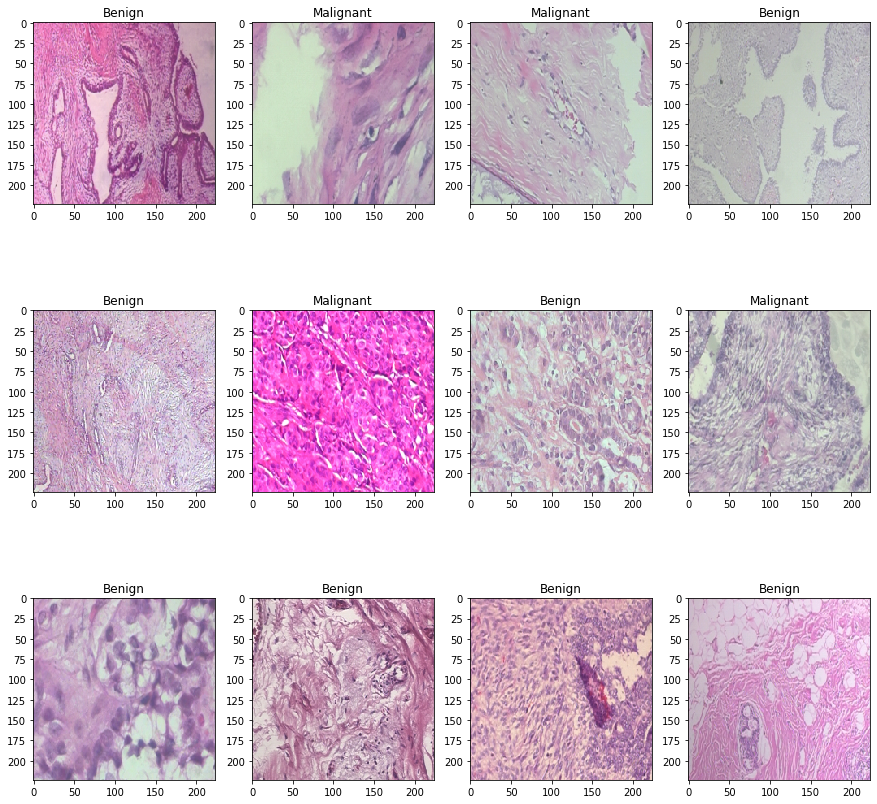

In [250]:
x_train, x_val, y_train, y_val = train_test_split(
    X_train, Y_train, 
    test_size=0.2, 
    random_state=11
)

w=60
h=40
fig=plt.figure(figsize=(15, 15))
columns = 4
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    if np.argmax(Y_train[i]) == 0:
        ax.title.set_text('Benign')
    else:
        ax.title.set_text('Malignant')
    plt.imshow(x_train[i], interpolation='nearest')
plt.show()

# CNN after Mix up Augmentation

In [29]:
7

7

In [25]:
from tensorflow import keras

In [26]:
m=keras.models.load_model('/Users/ssing623/Documents/B Cancer/model')

In [56]:
def build_model(backbone, lr=1e-4):
    model = Sequential()
    model.add(backbone)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(2, activation='softmax'))
    
    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(lr=lr),
        metrics=['accuracy']
    )
    return model

resnet = DenseNet201(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

model = build_model(resnet ,lr = 1e-4)
model.summary()

74842112/74836368 [==============================] - 5s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet201 (Functional)     (None, 7, 7, 1920)        18321984  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1920)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1920)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 1920)              7680      
_________________________________________________________________
dense (Dense)                (None, 2)                 3842      
Total params: 18,333,506
Trainable params: 18,100,610
Non-trainable params: 232,896
_________________________________________________________________


In [57]:
learn_control = ReduceLROnPlateau(monitor='val_acc', patience=5,
                                  verbose=1,factor=0.2, min_lr=1e-7)

filepath="weights.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

history = model.fit_generator(
    train_generator.flow(x_train, y_train, batch_size=BATCH_SIZE),
    steps_per_epoch=x_train.shape[0] / BATCH_SIZE,
    epochs=20,
    validation_data=(x_val, y_val),
    callbacks=[learn_control, checkpoint]
)

/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
200/200 [==============================] - 1608s 8s/step - loss: 0.5807 - accuracy: 0.7119 - val_loss: 0.2961 - val_accuracy: 0.8825
Epoch 2/20
200/200 [==============================] - 1537s 8s/step - loss: 0.3298 - accuracy: 0.8649 - val_loss: 0.1736 - val_accuracy: 0.9413
Epoch 3/20
200/200 [==============================] - 1545s 8s/step - loss: 0.2977 - accuracy: 0.8833 - val_loss: 0.1551 - val_accuracy: 0.9450
Epoch 4/20
200/200 [==============================] - 1545s 8s/step - loss: 0.3082 - accuracy: 0.8781 - val_loss: 0.4521 - val_accuracy: 0.8462
Epoch 5/20
200/200 [==============================] - 1548s 8s/step - loss: 0.2522 - accuracy: 0.9019 - val_loss: 0.2200 - val_accuracy: 0.9075
Epoch 6/20
200/200 [==============================] - 1587s 8s/step - loss: 0.2464 - accuracy: 0.8982 - val_loss: 0.1176 - val_accuracy: 0.9538
Epoch 7/20
200/200 [==============================] - 2222s 11s/step - loss: 0.2411 - accuracy: 0.9137 - val_loss: 0.7633 - val_accuracy

<AxesSubplot:>

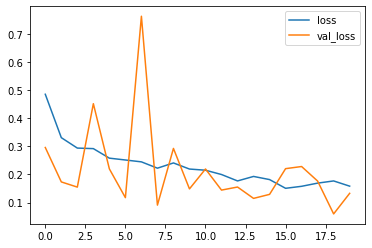

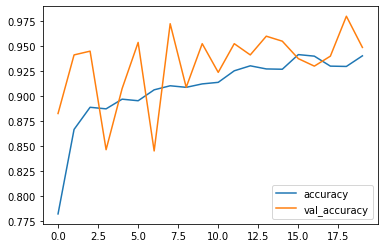

In [70]:
history_df = pd.DataFrame(history.history)
history_df[['loss', 'val_loss']].plot()

history_df = pd.DataFrame(history.history)
history_df[['accuracy', 'val_accuracy']].plot()

In [262]:
# y_pred=m.predict(X_test)

In [259]:
y_pred=model.predict(X_train)

In [279]:
from sklearn.metrics import classification_report
print(classification_report( np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1)))



              precision    recall  f1-score   support

           0       0.86      1.00      0.92         6
           1       1.00      0.90      0.95        10

    accuracy                           0.94        16
   macro avg       0.93      0.95      0.94        16
weighted avg       0.95      0.94      0.94        16



Confusion matrix, without normalization
[[ 793   39]
 [ 196 1124]]


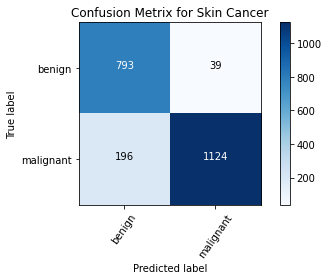

In [281]:

from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=55)
    plt.yticks(tick_marks, classes)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

cm = confusion_matrix(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))

cm_plot_label =['benign', 'malignant']
plot_confusion_matrix(cm, cm_plot_label, title ='Confusion Metrix for Skin Cancer')

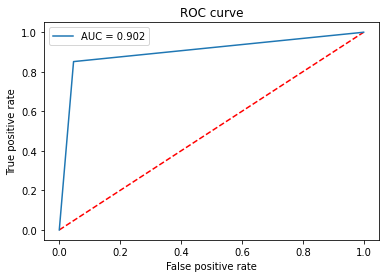

In [282]:
from sklearn.metrics import roc_auc_score, auc
from sklearn.metrics import roc_curve
roc_log = roc_auc_score(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
false_positive_rate, true_positive_rate, threshold = roc_curve(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
area_under_curve = auc(false_positive_rate, true_positive_rate)

plt.plot([0, 1], [0, 1], 'r--')
plt.plot(false_positive_rate, true_positive_rate, label='AUC = {:.3f}'.format(area_under_curve))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()
#plt.savefig(ROC_PLOT_FILE, bbox_inches='tight')
plt.close()

# Knowledge Disillation

In [27]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np

In [28]:
class Distiller(keras.Model):
    def __init__(self, student, teacher):
        super(Distiller, self).__init__()
        self.teacher = teacher
        self.student = student

    def compile(
        self,
        optimizer,
        metrics,
        student_loss_fn,
        distillation_loss_fn,
        alpha=0.1,
        temperature=3,
    ):
        """ Configure the distiller.

        Args:
            optimizer: Keras optimizer for the student weights
            metrics: Keras metrics for evaluation
            student_loss_fn: Loss function of difference between student
                predictions and ground-truth
            distillation_loss_fn: Loss function of difference between soft
                student predictions and soft teacher predictions
            alpha: weight to student_loss_fn and 1-alpha to distillation_loss_fn
            temperature: Temperature for softening probability distributions.
                Larger temperature gives softer distributions.
        """
        super(Distiller, self).compile(optimizer=optimizer, metrics=metrics)
        self.student_loss_fn = student_loss_fn
        self.distillation_loss_fn = distillation_loss_fn
        self.alpha = alpha
        self.temperature = temperature

    def train_step(self, data):
        # Unpack data
        x, y = data

        # Forward pass of teacher
        teacher_predictions = self.teacher(x, training=False)

        with tf.GradientTape() as tape:
            # Forward pass of student
            student_predictions = self.student(x, training=True)

            # Compute losses
            student_loss = self.student_loss_fn(y, student_predictions)
            distillation_loss = self.distillation_loss_fn(
                tf.nn.softmax(teacher_predictions / self.temperature, axis=1),
                tf.nn.softmax(student_predictions / self.temperature, axis=1),
            )
            loss = self.alpha * student_loss + (1 - self.alpha) * distillation_loss

        # Compute gradients
        trainable_vars = self.student.trainable_variables
        gradients = tape.gradient(loss, trainable_vars)

        # Update weights
        self.optimizer.apply_gradients(zip(gradients, trainable_vars))

        # Update the metrics configured in `compile()`.
        self.compiled_metrics.update_state(y, student_predictions)

        # Return a dict of performance
        results = {m.name: m.result() for m in self.metrics}
        results.update(
            {"student_loss": student_loss, "distillation_loss": distillation_loss}
        )
        return results

    def test_step(self, data):
        # Unpack the data
        x, y = data

        # Compute predictions
        y_prediction = self.student(x, training=False)

        # Calculate the loss
        student_loss = self.student_loss_fn(y, y_prediction)

        # Update the metrics.
        self.compiled_metrics.update_state(y, y_prediction)

        # Return a dict of performance
        results = {m.name: m.result() for m in self.metrics}
        results.update({"student_loss": student_loss})
        return results

In [46]:
def build_model2(backbone, lr=1e-4):
    model = Sequential()
    model.add(backbone)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(2, activation='softmax'))
    
    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(lr=lr),
        metrics=['accuracy']
    )
    return model

resnet = tf.keras.applications.DenseNet121(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

student = build_model2(resnet ,lr = 1e-4)
student.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet121 (Functional)     (None, 7, 7, 1024)        7037504   
_________________________________________________________________
global_average_pooling2d_1 ( (None, 1024)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 1024)              4096      
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 2050      
Total params: 7,043,650
Trainable params: 6,957,954
Non-trainable params: 85,696
_________________________________________________________________


In [47]:
# def build_model(backbone, lr=1e-4):
#     model = Sequential()
#     model.add(backbone)
#     model.add(layers.GlobalAveragePooling2D())
#     model.add(layers.Dropout(0.5))
#     model.add(layers.BatchNormalization())
#     model.add(layers.Dense(2, activation='softmax'))
    
#     model.compile(
#         loss='binary_crossentropy',
#         optimizer=Adam(lr=lr),
#         metrics=['accuracy']
#     )
#     return model

# resnet = DenseNet201(
#     weights='imagenet',
#     include_top=False,
#     input_shape=(224,224,3)
# )

# student = build_model(resnet ,lr = 1e-4)
# student.summary()

In [48]:
student_scratch = keras.models.clone_model(student)

In [49]:
teacher=keras.models.clone_model(m)

In [50]:
X_train.shape

(4367, 224, 224, 3)

In [51]:
type(Y_train),type(y_train)

(numpy.ndarray, numpy.ndarray)

In [52]:
y_train=np.array(pd.DataFrame(Y_train)[0])

In [53]:
y_train

array([1., 0., 0., ..., 0., 1., 0.], dtype=float32)

In [54]:
distiller = Distiller(student=student, teacher=teacher)
distiller.compile(
    optimizer=keras.optimizers.Adam(),
    metrics=[keras.metrics.SparseCategoricalAccuracy()],
    student_loss_fn=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    distillation_loss_fn=keras.losses.KLDivergence(),
    alpha=0.1,
    temperature=200,
)

# Distill teacher to student
distiller.fit(X_train, y_train, epochs=3)



Epoch 1/3
137/137 [==============================] - 1647s 12s/step - sparse_categorical_accuracy: 0.8413 - student_loss: 0.3984 - distillation_loss: 0.0026
Epoch 2/3
137/137 [==============================] - 1909s 14s/step - sparse_categorical_accuracy: 0.9047 - student_loss: 0.2508 - distillation_loss: 0.0027
Epoch 3/3
137/137 [==============================] - 2000s 15s/step - sparse_categorical_accuracy: 0.9237 - student_loss: 0.1932 - distillation_loss: 0.0028


In [55]:
y_test=np.array(pd.DataFrame(Y_test)[0])

In [56]:
# Evaluate student on test dataset
distiller.evaluate(X_test, y_test)

68/68 [==============================] - 136s 2s/step - sparse_categorical_accuracy: 0.8615 - student_loss: 0.3253


[0.8615241646766663, 0.1426590532064438]

In [57]:
student_scratch.compile(
    optimizer=keras.optimizers.Adam(),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[keras.metrics.SparseCategoricalAccuracy()],
)

# Train and evaluate student trained from scratch.
student_scratch.fit(X_train, y_train, epochs=3)
student_scratch.evaluate(X_test, y_test)

Epoch 1/3
137/137 [==============================] - 1321s 10s/step - loss: 0.5763 - sparse_categorical_accuracy: 0.7770
Epoch 2/3
137/137 [==============================] - 1463s 11s/step - loss: 0.4256 - sparse_categorical_accuracy: 0.8198
Epoch 3/3
68/68 [==============================] - 185s 3s/step - loss: 0.8276 - sparse_categorical_accuracy: 0.4991


[0.8275706768035889, 0.4990706443786621]

In [59]:
y_predS=student_scratch.predict(X_test)

In [80]:
from sklearn.metrics import classification_report

print(classification_report( np.argmax(Y_test, axis=1), np.argmax(y_predS, axis=1)))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00         1

    accuracy                           1.00         1
   macro avg       1.00      1.00      1.00         1
weighted avg       1.00      1.00      1.00         1



# TIME Difference between RESNET152 and DenseNe121

In [82]:
def build_model(backbone, lr=1e-4):
    model = Sequential()
    model.add(backbone)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(2, activation='softmax'))
    
    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(lr=lr),
        metrics=['accuracy']
    )
    return model

resnet = tf.keras.applications.ResNet152(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

model = build_model(resnet ,lr = 1e-4)
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet152 (Functional)       (None, 7, 7, 2048)        58370944  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 2048)              0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 2048)              0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 2048)              8192      
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 4098      
Total params: 58,383,234
Trainable params: 58,227,714
Non-trainable params: 155,520
_________________________________________________________________


In [111]:

learn_control = ReduceLROnPlateau(monitor='val_acc', patience=5,
                                  verbose=1,factor=0.2, min_lr=1e-7)

filepath="weights.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

history = model.fit_generator(
    train_generator.flow(x_train, y_train, batch_size=BATCH_SIZE),
    steps_per_epoch=x_train.shape[0] / BATCH_SIZE,
    epochs=1,
    validation_data=(x_val, y_val),
    callbacks=[learn_control, checkpoint]
)

/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


218/218 [==============================] - 2056s 9s/step - loss: 0.5626 - accuracy: 0.7735 - val_loss: 2.2693 - val_accuracy: 0.5927


In [113]:
%%time
y_pred=model.predict(X_train[0:1])

CPU times: user 2.98 s, sys: 1.04 s, total: 4.02 s
Wall time: 3.48 s


In [114]:
%%time
y_pred=model.predict(X_train[0:200])

CPU times: user 6.85 s, sys: 4.61 s, total: 11.5 s
Wall time: 1.42 s


In [116]:
%%time
y_pred=model.predict(X_train[0:2000])

CPU times: user 1min 9s, sys: 40 s, total: 1min 49s
Wall time: 12.9 s


In [128]:
def build_model(backbone, lr=1e-4):
    model = Sequential()
    model.add(backbone)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(2, activation='softmax'))
    
    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(lr=lr),
        metrics=['accuracy']
    )
    return model

resnet = DenseNet201(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

model = build_model(resnet ,lr = 1e-4)
model.summary()



Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet201 (Functional)     (None, 7, 7, 1920)        18321984  
_________________________________________________________________
global_average_pooling2d_4 ( (None, 1920)              0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 1920)              0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 1920)              7680      
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 3842      
Total params: 18,333,506
Trainable params: 18,100,610
Non-trainable params: 232,896
_________________________________________________________________


In [120]:
learn_control = ReduceLROnPlateau(monitor='val_acc', patience=5,
                                  verbose=1,factor=0.2, min_lr=1e-7)

filepath="weights.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')



In [129]:

learn_control = ReduceLROnPlateau(monitor='val_acc', patience=5,
                                  verbose=1,factor=0.2, min_lr=1e-7)

filepath="weights.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

history = model.fit_generator(
    train_generator.flow(x_train, y_train, batch_size=BATCH_SIZE),
    steps_per_epoch=x_train.shape[0] / BATCH_SIZE,
    epochs=1,
    validation_data=(x_val, y_val),
    callbacks=[learn_control, checkpoint]
)

218/218 [==============================] - 2609s 12s/step - loss: 0.4956 - accuracy: 0.7844 - val_loss: 0.2822 - val_accuracy: 0.9073


In [130]:
%%time
y_pred=model.predict(X_train[0:1])

CPU times: user 2.98 s, sys: 1.21 s, total: 4.2 s
Wall time: 4.45 s


In [131]:
%%time
y_pred=model.predict(X_train[0:200])

CPU times: user 3.47 s, sys: 4.97 s, total: 8.44 s
Wall time: 1.09 s


In [132]:
%%time
y_pred=model.predict(X_train[0:2000])

CPU times: user 37.2 s, sys: 46.6 s, total: 1min 23s
Wall time: 11 s


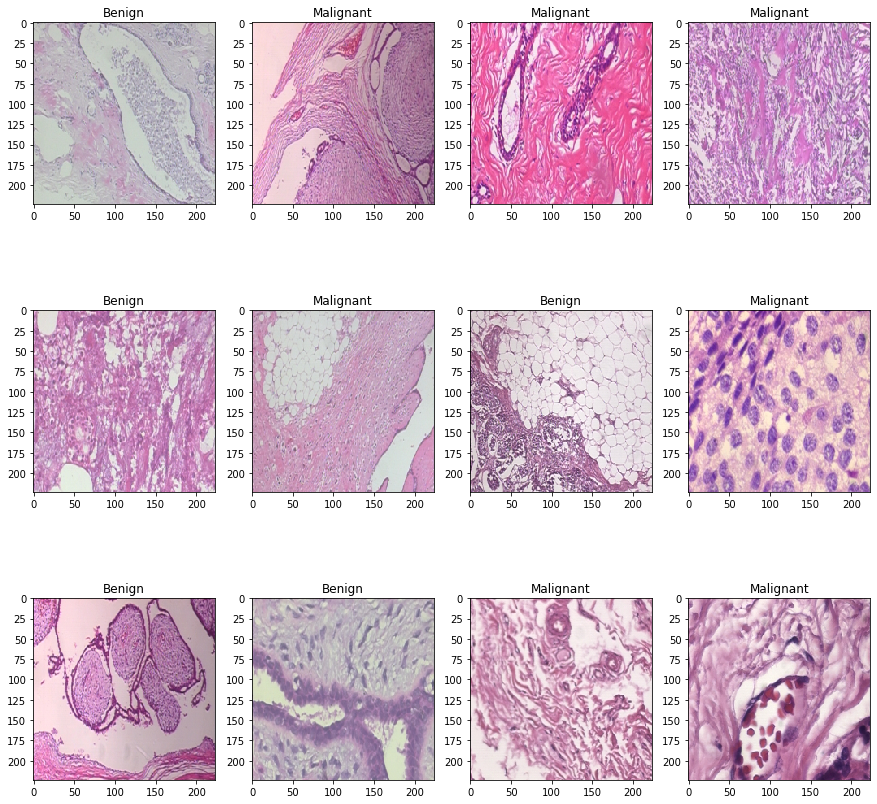

In [124]:
x_train, x_val, y_train, y_val = train_test_split(
    X_train, Y_train, 
    test_size=0.2, 
    random_state=11
)

w=60
h=40
fig=plt.figure(figsize=(15, 15))
columns = 4
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    if np.argmax(Y_train[i]) == 0:
        ax.title.set_text('Benign')
    else:
        ax.title.set_text('Malignant')
    plt.imshow(x_train[i], interpolation='nearest')
plt.show()

# Model on 40 X

In [5]:
import os
os.chdir('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast')

In [6]:
!ls

DCGAN_generated_output count_files.sh         malignant
README.txt             initial_weights.h5
benign                 logs


In [7]:
def Dataset_loader(DIR, RESIZE, sigmaX=200):
    IMG = []
    read = lambda imname: np.asarray(Image.open(imname).convert("RGB"))
    for IMAGE_NAME in tqdm(os.listdir(DIR)):
        PATH = os.path.join(DIR,IMAGE_NAME)
        _, ftype = os.path.splitext(PATH)
        if ftype == ".png":
            img = read(PATH)
           
            img = cv2.resize(img, (RESIZE,RESIZE))
           
            IMG.append(np.array(img))
    return IMG

In [8]:
path=os.walk('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB')

In [9]:
benign=[]
for root,directories, files in path:
    
    for directory in directories:
        if directory=='40X':
            benign.append(np.array(Dataset_loader(root+'/'+directory,224)))
            print(root+'/'+directory)

 17%|█▋        | 6/35 [00:00<00:00, 57.78it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/40X


 17%|█▋        | 6/35 [00:00<00:00, 59.98it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549G/40X


 40%|████      | 6/15 [00:00<00:00, 57.00it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549CD/40X


 17%|█▋        | 6/35 [00:00<00:00, 53.64it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-29960CD/40X


 15%|█▌        | 6/39 [00:00<00:00, 52.76it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184CD/40X


 40%|████      | 6/15 [00:00<00:00, 57.90it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184/40X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-13200/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-15275/40X


100%|██████████| 16/16 [00:00<00:00, 83.69it/s]


/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-21978AB/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-3411F/40X


 50%|█████     | 9/18 [00:00<00:00, 83.53it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-19854C/40X


 53%|█████▎    | 9/17 [00:00<00:00, 83.54it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-29960AB/40X


 17%|█▋        | 6/36 [00:00<00:00, 55.20it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23222AB/40X


 23%|██▎       | 6/26 [00:00<00:00, 57.65it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134/40X


  0%|          | 0/37 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-9133/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060CD/40X


 27%|██▋       | 6/22 [00:00<00:00, 55.44it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998CD/40X


 19%|█▉        | 6/31 [00:00<00:00, 53.91it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-25197/40X


 21%|██        | 6/29 [00:00<00:00, 51.09it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998EF/40X


 39%|███▉      | 9/23 [00:00<00:00, 83.38it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134E/40X


 16%|█▌        | 6/38 [00:00<00:00, 54.57it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060AB/40X


 10%|█         | 6/58 [00:00<00:00, 54.82it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-22704/40X


 46%|████▌     | 6/13 [00:00<00:00, 59.28it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-21998AB/40X


100%|██████████| 13/13 [00:00<00:00, 59.37it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-29315EF/40X


In [10]:
benign_final=np.array(list(itertools.chain.from_iterable(benign)))

In [11]:
benign_final.shape

(625, 224, 224, 3)

In [12]:
path=os.walk('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB')

In [13]:
malignant=[]
for root,directories, files in path:
    
    for directory in directories:
        if directory=='40X':
            malignant.append(np.array(Dataset_loader(root+'/'+directory,224)))
            print(root+'/'+directory)

 15%|█▌        | 7/46 [00:00<00:00, 62.27it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13418DE/40X


 23%|██▎       | 6/26 [00:00<00:00, 52.34it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-16456/40X


100%|██████████| 17/17 [00:00<00:00, 88.32it/s]


/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-12773/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979C/40X


  0%|          | 0/29 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842D/40X


 23%|██▎       | 6/26 [00:00<00:00, 57.98it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13413/40X


  0%|          | 0/19 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-10147/40X


 23%|██▎       | 7/30 [00:00<00:00, 66.57it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_15-190EF/40X


 17%|█▋        | 6/35 [00:00<00:00, 56.34it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15704/40X


 33%|███▎      | 7/21 [00:00<00:00, 61.65it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-19440/40X


100%|██████████| 17/17 [00:00<00:00, 87.86it/s]


/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-12465/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15687B/40X


 22%|██▏       | 6/27 [00:00<00:00, 53.71it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-9146/40X


  0%|          | 0/32 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11951/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-8168/40X


 43%|████▎     | 6/14 [00:00<00:00, 59.64it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-12312/40X


 25%|██▌       | 6/24 [00:00<00:00, 57.08it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15792/40X


 30%|███       | 6/20 [00:00<00:00, 58.82it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16188/40X


 27%|██▋       | 7/26 [00:00<00:00, 62.16it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2985/40X


 23%|██▎       | 6/26 [00:00<00:00, 56.44it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17915/40X


 30%|███       | 6/20 [00:00<00:00, 59.82it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17901/40X


 43%|████▎     | 6/14 [00:00<00:00, 57.12it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14926/40X


 26%|██▌       | 6/23 [00:00<00:00, 56.41it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16875/40X


  0%|          | 0/11 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15696/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16448/40X


 24%|██▍       | 7/29 [00:00<00:00, 61.07it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-10926/40X


 28%|██▊       | 7/25 [00:00<00:00, 63.08it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-18650/40X


 29%|██▊       | 6/21 [00:00<00:00, 55.52it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20636/40X


 54%|█████▍    | 7/13 [00:00<00:00, 61.31it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4372/40X


 23%|██▎       | 6/26 [00:00<00:00, 58.60it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16336/40X


 25%|██▌       | 8/32 [00:00<00:00, 74.44it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-3909/40X


 26%|██▌       | 6/23 [00:00<00:00, 58.50it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13412/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4364/40X


 17%|█▋        | 6/36 [00:00<00:00, 58.09it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5287/40X


 18%|█▊        | 7/38 [00:00<00:00, 65.53it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20629/40X


 33%|███▎      | 6/18 [00:00<00:00, 59.79it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16716/40X


100%|██████████| 12/12 [00:00<00:00, 60.60it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14015/40X



  0%|          | 0/30 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16601/40X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2523/40X


 30%|███       | 6/20 [00:00<00:00, 58.17it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2773/40X


 50%|█████     | 7/14 [00:00<00:00, 61.66it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2980/40X


 19%|█▉        | 7/37 [00:00<00:00, 66.24it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11031/40X


 23%|██▎       | 7/31 [00:00<00:00, 60.65it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13993/40X


 26%|██▌       | 6/23 [00:00<00:00, 55.64it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14946/40X


 27%|██▋       | 6/22 [00:00<00:00, 54.84it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15572/40X


 19%|█▉        | 6/32 [00:00<00:00, 57.54it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5694/40X


 24%|██▍       | 6/25 [00:00<00:00, 54.29it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-6241/40X


 26%|██▌       | 6/23 [00:00<00:00, 55.36it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11520/40X


 15%|█▌        | 6/39 [00:00<00:00, 56.75it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5695/40X


 38%|███▊      | 10/26 [00:00<00:00, 93.77it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17614/40X


 32%|███▏      | 7/22 [00:00<00:00, 66.42it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-9461/40X


 22%|██▏       | 7/32 [00:00<00:00, 63.64it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-16196/40X


 12%|█▏        | 6/51 [00:00<00:00, 56.22it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-13412/40X


 19%|█▉        | 6/31 [00:00<00:00, 52.82it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570/40X


 30%|███       | 6/20 [00:00<00:00, 56.73it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570C/40X


100%|██████████| 20/20 [00:00<00:00, 59.97it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-12204/40X


In [14]:
malignant_final=np.array(list(itertools.chain.from_iterable(malignant)))

In [15]:
malignant_final.shape

(1370, 224, 224, 3)

In [16]:
benign_label = np.zeros(len(benign_final))
malign_label = np.ones(len(malignant_final))

In [17]:
X=np.concatenate((benign_final, malignant_final), axis = 0)

In [18]:
Y=np.concatenate((benign_label, malign_label), axis = 0)

In [19]:
from sklearn.model_selection import train_test_split

In [20]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

In [23]:
pd.DataFrame(Y_test)[0].value_counts()

1.0    438
0.0    221
Name: 0, dtype: int64

In [24]:
pd.DataFrame(Y_train)[0].value_counts()

1.0    932
0.0    404
Name: 0, dtype: int64

In [25]:
s = np.arange(X_train.shape[0])
np.random.shuffle(s)
X_train = X_train[s]
Y_train = Y_train[s]

s = np.arange(X_test.shape[0])
np.random.shuffle(s)
X_test = X_test[s]
Y_test = Y_test[s]

Y_train = to_categorical(Y_train, num_classes= 2)
Y_test = to_categorical(Y_test, num_classes= 2)

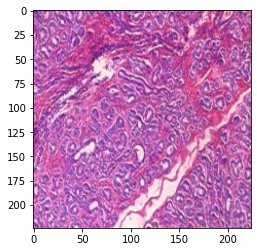

In [26]:
plt.imshow(X_train[0])

In [27]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 64
EPOCHS = 200

In [28]:
val_samples = 2000
x_val, y_val = X_train[:val_samples], Y_train[:val_samples]
new_x_train, new_y_train = X_train[val_samples:], Y_train[val_samples:]



In [29]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 64
EPOCHS = 200

val_samples = 2000
x_val, y_val = X_train[:val_samples], Y_train[:val_samples]
new_x_train, new_y_train = X_train[val_samples:], Y_train[val_samples:]



In [30]:
BATCH_SIZE = 16

train_generator = ImageDataGenerator(
        zoom_range=2,  # set range for random zoom
        rotation_range = 90,
        horizontal_flip=True,  # randomly flip images
        vertical_flip=True,  # randomly flip images
        shear_range=0.7,
        brightness_range=[0.2,0.6]
    )

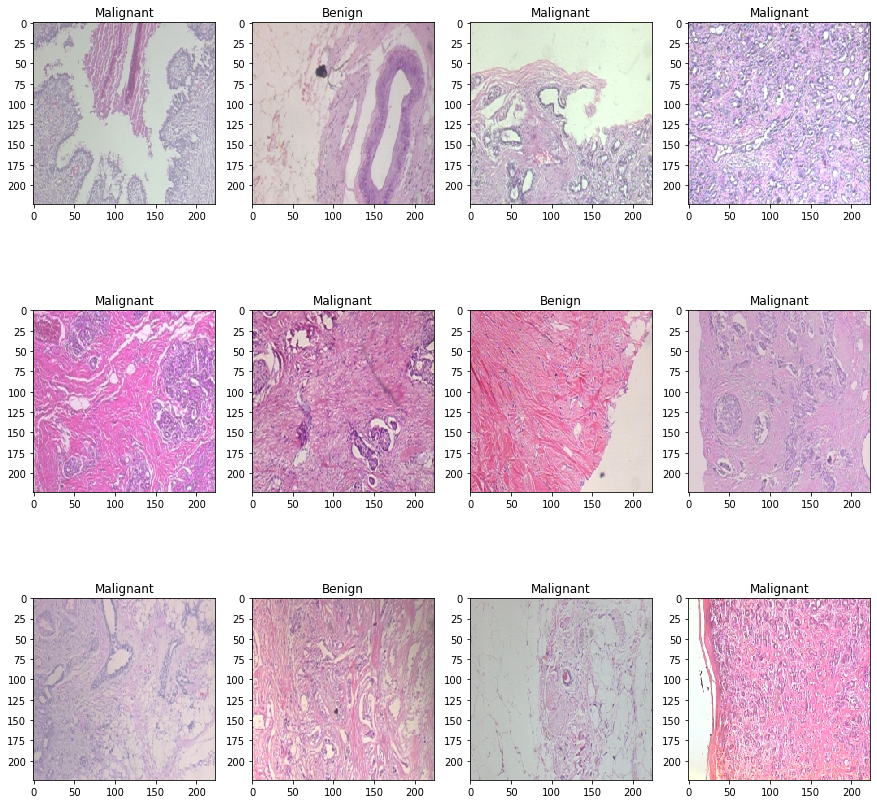

In [33]:
x_train, x_val, y_train, y_val = train_test_split(
    X_train, Y_train, 
    test_size=0.2, 
    random_state=11
)

w=60
h=40
fig=plt.figure(figsize=(15, 15))
columns = 4
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    if np.argmax(Y_train[i]) == 0:
        ax.title.set_text('Benign')
    else:
        ax.title.set_text('Malignant')
    plt.imshow(x_train[i], interpolation='nearest')
plt.show()

# Convolutional Neural Network

In [34]:
def build_model(backbone, lr=1e-4):
    model = Sequential()
    model.add(backbone)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(2, activation='softmax'))
    
    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(lr=lr),
        metrics=['accuracy']
    )
    return model

resnet = DenseNet201(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

model = build_model(resnet ,lr = 1e-4)
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet201 (Functional)     (None, 7, 7, 1920)        18321984  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 1920)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1920)              0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 1920)              7680      
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 3842      
Total params: 18,333,506
Trainable params: 18,100,610
Non-trainable params: 232,896
_________________________________________________________________


In [35]:
learn_control = ReduceLROnPlateau(monitor='val_acc', patience=5,
                                  verbose=1,factor=0.2, min_lr=1e-7)

filepath="weights.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

history = model.fit_generator(
    train_generator.flow(x_train, y_train, batch_size=BATCH_SIZE),
    steps_per_epoch=x_train.shape[0] / BATCH_SIZE,
    epochs=20,
    validation_data=(x_val, y_val),
    callbacks=[learn_control, checkpoint]
)

/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
66/66 [==============================] - 568s 8s/step - loss: 0.5825 - accuracy: 0.7360 - val_loss: 0.4407 - val_accuracy: 0.8172
Epoch 2/20
66/66 [==============================] - 548s 8s/step - loss: 0.4341 - accuracy: 0.8390 - val_loss: 0.9421 - val_accuracy: 0.6194
Epoch 3/20
66/66 [==============================] - 522s 8s/step - loss: 0.3564 - accuracy: 0.8727 - val_loss: 0.3271 - val_accuracy: 0.8955
Epoch 4/20
66/66 [==============================] - 522s 8s/step - loss: 0.3295 - accuracy: 0.8773 - val_loss: 0.2672 - val_accuracy: 0.8843
Epoch 5/20
66/66 [==============================] - 534s 8s/step - loss: 0.3251 - accuracy: 0.8801 - val_loss: 0.4834 - val_accuracy: 0.7612
Epoch 6/20
66/66 [==============================] - 591s 9s/step - loss: 0.3240 - accuracy: 0.8867 - val_loss: 0.3342 - val_accuracy: 0.8209
Epoch 7/20
66/66 [==============================] - 661s 10s/step - loss: 0.2772 - accuracy: 0.8876 - val_loss: 0.2278 - val_accuracy: 0.9254
Epoch 8/20
6

<AxesSubplot:>

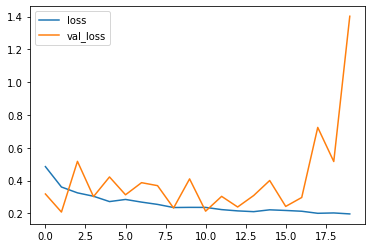

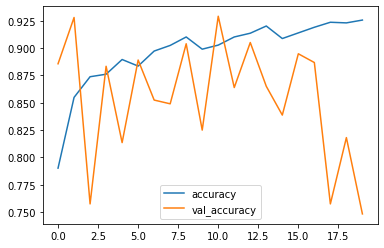

In [147]:
history_df = pd.DataFrame(history.history)
history_df[['loss', 'val_loss']].plot()

history_df = pd.DataFrame(history.history)
history_df[['accuracy', 'val_accuracy']].plot()

In [36]:
y_pred=model.predict(X_test)

In [37]:
from sklearn.metrics import classification_report
classification_report( np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))



'              precision    recall  f1-score   support\n\n           0       0.96      0.71      0.82       221\n           1       0.87      0.98      0.92       438\n\n    accuracy                           0.89       659\n   macro avg       0.92      0.85      0.87       659\nweighted avg       0.90      0.89      0.89       659\n'

In [38]:

print(classification_report( np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1)))

              precision    recall  f1-score   support

           0       0.96      0.71      0.82       221
           1       0.87      0.98      0.92       438

    accuracy                           0.89       659
   macro avg       0.92      0.85      0.87       659
weighted avg       0.90      0.89      0.89       659



Confusion matrix, without normalization
[[158  63]
 [  7 431]]


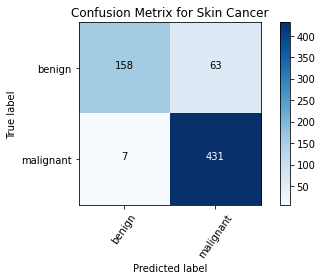

In [39]:

from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=55)
    plt.yticks(tick_marks, classes)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

cm = confusion_matrix(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))

cm_plot_label =['benign', 'malignant']
plot_confusion_matrix(cm, cm_plot_label, title ='Confusion Metrix for Skin Cancer')

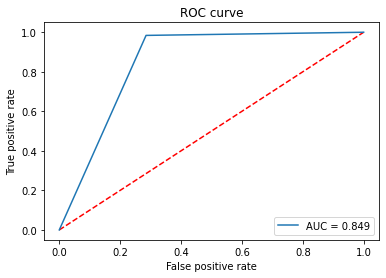

In [40]:
from sklearn.metrics import roc_auc_score, auc
from sklearn.metrics import roc_curve
roc_log = roc_auc_score(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
false_positive_rate, true_positive_rate, threshold = roc_curve(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
area_under_curve = auc(false_positive_rate, true_positive_rate)

plt.plot([0, 1], [0, 1], 'r--')
plt.plot(false_positive_rate, true_positive_rate, label='AUC = {:.3f}'.format(area_under_curve))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()
#plt.savefig(ROC_PLOT_FILE, bbox_inches='tight')
plt.close()

In [41]:
from tensorflow import keras

In [42]:
model.save('/Users/ssing623/Documents/B Cancer/model_40X')

INFO:tensorflow:Assets written to: /Users/ssing623/Documents/B Cancer/model_40X/assets


# Model on 100 X

In [36]:
import os
os.chdir('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast')

In [37]:
!ls

DCGAN_generated_output count_files.sh         malignant
README.txt             initial_weights.h5
benign                 logs


In [38]:
def Dataset_loader(DIR, RESIZE, sigmaX=200):
    IMG = []
    read = lambda imname: np.asarray(Image.open(imname).convert("RGB"))
    for IMAGE_NAME in tqdm(os.listdir(DIR)):
        PATH = os.path.join(DIR,IMAGE_NAME)
        _, ftype = os.path.splitext(PATH)
        if ftype == ".png":
            img = read(PATH)
           
            img = cv2.resize(img, (RESIZE,RESIZE))
           
            IMG.append(np.array(img))
    return IMG

In [39]:
path=os.walk('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB')

In [40]:
benign=[]
for root,directories, files in path:
    
    for directory in directories:
        if directory=='100X':
            benign.append(np.array(Dataset_loader(root+'/'+directory,224)))
            print(root+'/'+directory)

 18%|█▊        | 6/34 [00:00<00:00, 55.47it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X


 19%|█▉        | 7/36 [00:00<00:00, 62.88it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549G/100X


 46%|████▌     | 6/13 [00:00<00:00, 58.87it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549CD/100X


 16%|█▌        | 6/37 [00:00<00:00, 55.47it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-29960CD/100X


 18%|█▊        | 6/34 [00:00<00:00, 54.34it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184CD/100X


 43%|████▎     | 6/14 [00:00<00:00, 58.45it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184/100X


  0%|          | 0/18 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-13200/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-15275/100X


 47%|████▋     | 8/17 [00:00<00:00, 77.62it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-21978AB/100X


100%|██████████| 16/16 [00:00<00:00, 81.69it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-3411F/100X



  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-19854C/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-29960AB/100X


 19%|█▉        | 6/31 [00:00<00:00, 53.27it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23222AB/100X


 17%|█▋        | 6/36 [00:00<00:00, 54.55it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134/100X


  0%|          | 0/31 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-9133/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060CD/100X


 18%|█▊        | 6/33 [00:00<00:00, 52.66it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998CD/100X


 18%|█▊        | 6/33 [00:00<00:00, 56.10it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-25197/100X


 19%|█▉        | 6/32 [00:00<00:00, 56.05it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998EF/100X


 41%|████      | 9/22 [00:00<00:00, 86.40it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134E/100X


 15%|█▌        | 6/39 [00:00<00:00, 56.36it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060AB/100X


  9%|▉         | 6/66 [00:00<00:01, 57.08it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-22704/100X


 38%|███▊      | 6/16 [00:00<00:00, 57.11it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-21998AB/100X


100%|██████████| 16/16 [00:00<00:00, 58.66it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-29315EF/100X


In [41]:
benign_final=np.array(list(itertools.chain.from_iterable(benign)))

In [42]:
benign_final.shape

(644, 224, 224, 3)

In [43]:
path=os.walk('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB')

In [44]:
malignant=[]
for root,directories, files in path:
    
    for directory in directories:
        if directory=='100X':
            malignant.append(np.array(Dataset_loader(root+'/'+directory,224)))
            print(root+'/'+directory)

 14%|█▍        | 7/50 [00:00<00:00, 65.03it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13418DE/100X


 28%|██▊       | 7/25 [00:00<00:00, 63.77it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-16456/100X


  0%|          | 0/22 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-12773/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979C/100X


  0%|          | 0/41 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842D/100X


 22%|██▏       | 6/27 [00:00<00:00, 55.65it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13413/100X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-10147/100X


 24%|██▍       | 7/29 [00:00<00:00, 60.96it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_15-190EF/100X


 16%|█▌        | 6/38 [00:00<00:00, 57.35it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15704/100X


 29%|██▊       | 6/21 [00:00<00:00, 56.78it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-19440/100X


  0%|          | 0/22 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-12465/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15687B/100X


 24%|██▍       | 6/25 [00:00<00:00, 54.93it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-9146/100X


  0%|          | 0/41 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11951/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-8168/100X


 43%|████▎     | 6/14 [00:00<00:00, 57.86it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-12312/100X


 32%|███▏      | 6/19 [00:00<00:00, 54.25it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15792/100X


 55%|█████▍    | 6/11 [00:00<00:00, 55.72it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16188/100X


 38%|███▊      | 6/16 [00:00<00:00, 58.19it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2985/100X


 23%|██▎       | 6/26 [00:00<00:00, 55.39it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17915/100X


 32%|███▏      | 6/19 [00:00<00:00, 58.02it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17901/100X


 27%|██▋       | 6/22 [00:00<00:00, 56.30it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14926/100X


 26%|██▌       | 6/23 [00:00<00:00, 57.84it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16875/100X


 50%|█████     | 7/14 [00:00<00:00, 64.40it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15696/100X


  0%|          | 0/22 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16448/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-10926/100X


 16%|█▌        | 6/37 [00:00<00:00, 56.73it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-18650/100X


 27%|██▋       | 6/22 [00:00<00:00, 56.82it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20636/100X


 32%|███▏      | 6/19 [00:00<00:00, 54.86it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4372/100X


 23%|██▎       | 6/26 [00:00<00:00, 56.15it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16336/100X


 18%|█▊        | 6/33 [00:00<00:00, 57.07it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-3909/100X


  0%|          | 0/21 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13412/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4364/100X


 18%|█▊        | 6/33 [00:00<00:00, 57.46it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5287/100X


 19%|█▉        | 7/36 [00:00<00:00, 64.19it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20629/100X


 22%|██▏       | 6/27 [00:00<00:00, 55.19it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16716/100X


  0%|          | 0/23 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14015/100X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16601/100X


 15%|█▍        | 6/41 [00:00<00:00, 58.16it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2523/100X


 24%|██▍       | 6/25 [00:00<00:00, 55.01it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2773/100X


 41%|████      | 7/17 [00:00<00:00, 63.01it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2980/100X


 17%|█▋        | 7/42 [00:00<00:00, 61.86it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11031/100X


 22%|██▏       | 7/32 [00:00<00:00, 65.60it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13993/100X


 26%|██▌       | 6/23 [00:00<00:00, 55.66it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14946/100X


 29%|██▊       | 6/21 [00:00<00:00, 54.39it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15572/100X


 29%|██▊       | 6/21 [00:00<00:00, 59.28it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5694/100X


 23%|██▎       | 6/26 [00:00<00:00, 55.23it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-6241/100X


 29%|██▊       | 6/21 [00:00<00:00, 54.73it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11520/100X


 21%|██        | 6/29 [00:00<00:00, 56.76it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5695/100X


 17%|█▋        | 6/36 [00:00<00:00, 54.46it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17614/100X


 41%|████      | 7/17 [00:00<00:00, 63.37it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-9461/100X


 18%|█▊        | 6/33 [00:00<00:00, 55.21it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-16196/100X


 11%|█         | 6/54 [00:00<00:00, 55.65it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-13412/100X


 17%|█▋        | 6/35 [00:00<00:00, 55.45it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570/100X


 19%|█▉        | 6/31 [00:00<00:00, 56.00it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570C/100X


100%|██████████| 31/31 [00:00<00:00, 53.50it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-12204/100X


In [45]:
malignant_final=np.array(list(itertools.chain.from_iterable(malignant)))

In [46]:
malignant_final.shape

(1437, 224, 224, 3)

In [47]:
benign_label = np.zeros(len(benign_final))
malign_label = np.ones(len(malignant_final))

In [48]:
X=np.concatenate((benign_final, malignant_final), axis = 0)

In [49]:
Y=np.concatenate((benign_label, malign_label), axis = 0)

In [50]:
from sklearn.model_selection import train_test_split

In [51]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

In [52]:
pd.DataFrame(Y_test)[0].value_counts()

1.0    459
0.0    228
Name: 0, dtype: int64

In [53]:
pd.DataFrame(Y_train)[0].value_counts()

1.0    978
0.0    416
Name: 0, dtype: int64

In [54]:
s = np.arange(X_train.shape[0])
np.random.shuffle(s)
X_train = X_train[s]
Y_train = Y_train[s]

s = np.arange(X_test.shape[0])
np.random.shuffle(s)
X_test = X_test[s]
Y_test = Y_test[s]

Y_train = to_categorical(Y_train, num_classes= 2)
Y_test = to_categorical(Y_test, num_classes= 2)

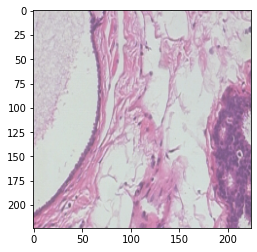

In [55]:
plt.imshow(X_train[0])

In [56]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 64
EPOCHS = 10

In [57]:
val_samples = 2000
x_val, y_val = X_train[:val_samples], Y_train[:val_samples]
new_x_train, new_y_train = X_train[val_samples:], Y_train[val_samples:]



In [58]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 64
EPOCHS = 10

val_samples = 2000
x_val, y_val = X_train[:val_samples], Y_train[:val_samples]
new_x_train, new_y_train = X_train[val_samples:], Y_train[val_samples:]



In [59]:
BATCH_SIZE = 16

train_generator = ImageDataGenerator(
        zoom_range=2,  # set range for random zoom
        rotation_range = 90,
        horizontal_flip=True,  # randomly flip images
        vertical_flip=True,  # randomly flip images
        shear_range=0.7,
        brightness_range=[0.2,0.6]
    )

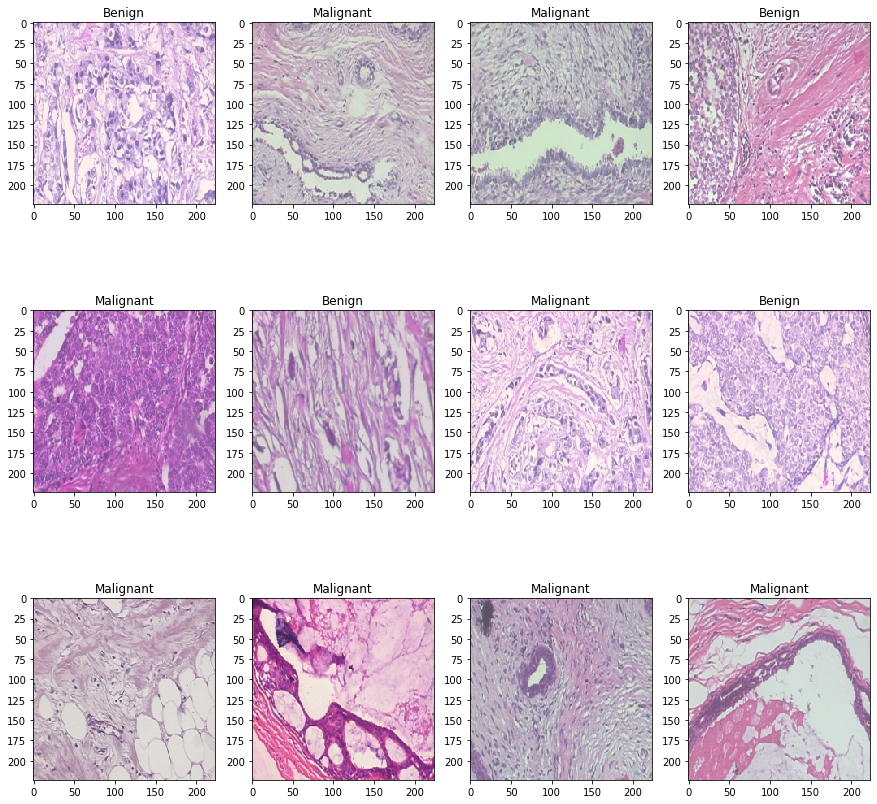

In [60]:
x_train, x_val, y_train, y_val = train_test_split(
    X_train, Y_train, 
    test_size=0.2, 
    random_state=11
)

w=60
h=40
fig=plt.figure(figsize=(15, 15))
columns = 4
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    if np.argmax(Y_train[i]) == 0:
        ax.title.set_text('Benign')
    else:
        ax.title.set_text('Malignant')
    plt.imshow(x_train[i], interpolation='nearest')
plt.show()

# Convolutional Neural Network

In [61]:
def build_model(backbone, lr=1e-4):
    model = Sequential()
    model.add(backbone)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(2, activation='softmax'))
    
    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(lr=lr),
        metrics=['accuracy']
    )
    return model

resnet = DenseNet201(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

model = build_model(resnet ,lr = 1e-4)
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet201 (Functional)     (None, 7, 7, 1920)        18321984  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 1920)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1920)              0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 1920)              7680      
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 3842      
Total params: 18,333,506
Trainable params: 18,100,610
Non-trainable params: 232,896
_________________________________________________________________


In [62]:
learn_control = ReduceLROnPlateau(monitor='val_acc', patience=5,
                                  verbose=1,factor=0.2, min_lr=1e-7)

filepath="weights.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

history = model.fit_generator(
    train_generator.flow(x_train, y_train, batch_size=BATCH_SIZE),
    steps_per_epoch=x_train.shape[0] / BATCH_SIZE,
    epochs=10,
    validation_data=(x_val, y_val),
    callbacks=[learn_control, checkpoint]
)

/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
69/69 [==============================] - 610s 9s/step - loss: 0.5927 - accuracy: 0.7327 - val_loss: 0.5870 - val_accuracy: 0.7384
Epoch 2/10
69/69 [==============================] - 576s 8s/step - loss: 0.4476 - accuracy: 0.8332 - val_loss: 0.2712 - val_accuracy: 0.9283
Epoch 3/10
69/69 [==============================] - 572s 8s/step - loss: 0.3694 - accuracy: 0.8637 - val_loss: 0.3123 - val_accuracy: 0.9032
Epoch 4/10
69/69 [==============================] - 653s 9s/step - loss: 0.3572 - accuracy: 0.8628 - val_loss: 0.3449 - val_accuracy: 0.8638
Epoch 5/10
69/69 [==============================] - 684s 10s/step - loss: 0.3083 - accuracy: 0.8825 - val_loss: 0.2430 - val_accuracy: 0.8961
Epoch 6/10
69/69 [==============================] - 660s 9s/step - loss: 0.2616 - accuracy: 0.9031 - val_loss: 0.2482 - val_accuracy: 0.9068
Epoch 7/10
69/69 [==============================] - 653s 9s/step - loss: 0.2622 - accuracy: 0.9022 - val_loss: 0.3427 - val_accuracy: 0.9068
Epoch 8/10
6

<AxesSubplot:>

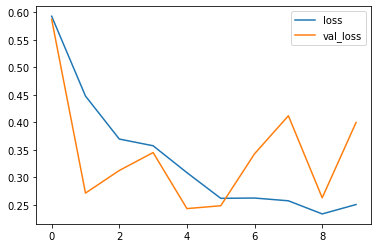

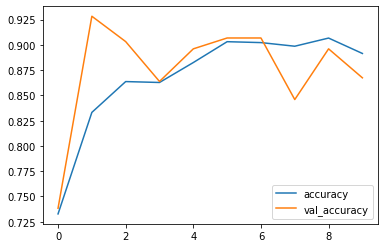

In [63]:
history_df = pd.DataFrame(history.history)
history_df[['loss', 'val_loss']].plot()

history_df = pd.DataFrame(history.history)
history_df[['accuracy', 'val_accuracy']].plot()

In [64]:
y_pred=model.predict(X_test)

In [65]:
from sklearn.metrics import classification_report
classification_report( np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))



'              precision    recall  f1-score   support\n\n           0       0.66      0.89      0.76       228\n           1       0.94      0.78      0.85       459\n\n    accuracy                           0.82       687\n   macro avg       0.80      0.84      0.81       687\nweighted avg       0.85      0.82      0.82       687\n'

In [66]:

print(classification_report( np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1)))

              precision    recall  f1-score   support

           0       0.66      0.89      0.76       228
           1       0.94      0.78      0.85       459

    accuracy                           0.82       687
   macro avg       0.80      0.84      0.81       687
weighted avg       0.85      0.82      0.82       687



Confusion matrix, without normalization
[[204  24]
 [103 356]]


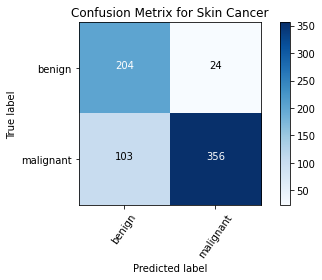

In [67]:

from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=55)
    plt.yticks(tick_marks, classes)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

cm = confusion_matrix(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))

cm_plot_label =['benign', 'malignant']
plot_confusion_matrix(cm, cm_plot_label, title ='Confusion Metrix for Skin Cancer')

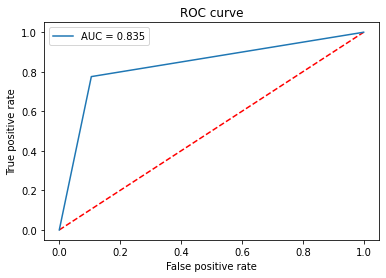

In [68]:
from sklearn.metrics import roc_auc_score, auc
from sklearn.metrics import roc_curve
roc_log = roc_auc_score(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
false_positive_rate, true_positive_rate, threshold = roc_curve(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
area_under_curve = auc(false_positive_rate, true_positive_rate)

plt.plot([0, 1], [0, 1], 'r--')
plt.plot(false_positive_rate, true_positive_rate, label='AUC = {:.3f}'.format(area_under_curve))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()
#plt.savefig(ROC_PLOT_FILE, bbox_inches='tight')
plt.close()

In [69]:
from tensorflow import keras

In [70]:
model.save('/Users/ssing623/Documents/B Cancer/model_100X')

INFO:tensorflow:Assets written to: /Users/ssing623/Documents/B Cancer/model_100X/assets


# Model on 200 X

In [5]:
import os
os.chdir('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast')

In [6]:
!ls

DCGAN_generated_output count_files.sh         malignant
README.txt             initial_weights.h5
benign                 logs


In [7]:
def Dataset_loader(DIR, RESIZE, sigmaX=200):
    IMG = []
    read = lambda imname: np.asarray(Image.open(imname).convert("RGB"))
    for IMAGE_NAME in tqdm(os.listdir(DIR)):
        PATH = os.path.join(DIR,IMAGE_NAME)
        _, ftype = os.path.splitext(PATH)
        if ftype == ".png":
            img = read(PATH)
           
            img = cv2.resize(img, (RESIZE,RESIZE))
           
            IMG.append(np.array(img))
    return IMG

In [8]:
path=os.walk('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB')

In [9]:
benign=[]
for root,directories, files in path:
    
    for directory in directories:
        if directory=='200X':
            benign.append(np.array(Dataset_loader(root+'/'+directory,224)))
            print(root+'/'+directory)

 19%|█▉        | 6/32 [00:00<00:00, 53.81it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/200X


 23%|██▎       | 7/31 [00:00<00:00, 62.58it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549G/200X


 44%|████▍     | 7/16 [00:00<00:00, 64.86it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549CD/200X


 26%|██▌       | 6/23 [00:00<00:00, 54.77it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-29960CD/200X


 17%|█▋        | 6/35 [00:00<00:00, 56.12it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184CD/200X


 33%|███▎      | 7/21 [00:00<00:00, 61.57it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184/200X


  0%|          | 0/17 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-13200/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-15275/200X


100%|██████████| 16/16 [00:00<00:00, 84.57it/s]


/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-21978AB/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-3411F/200X


 50%|█████     | 9/18 [00:00<00:00, 88.67it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-19854C/200X


 53%|█████▎    | 9/17 [00:00<00:00, 82.37it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-29960AB/200X


 16%|█▌        | 6/38 [00:00<00:00, 54.30it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23222AB/200X


 16%|█▌        | 6/38 [00:00<00:00, 56.79it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134/200X


  0%|          | 0/37 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-9133/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060CD/200X


 19%|█▉        | 6/32 [00:00<00:00, 55.83it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998CD/200X


 21%|██        | 6/29 [00:00<00:00, 56.77it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-25197/200X


 29%|██▊       | 6/21 [00:00<00:00, 56.35it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998EF/200X


 50%|█████     | 9/18 [00:00<00:00, 83.70it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134E/200X


 14%|█▍        | 6/42 [00:00<00:00, 55.23it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060AB/200X


 12%|█▏        | 6/52 [00:00<00:00, 56.11it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-22704/200X


 50%|█████     | 7/14 [00:00<00:00, 64.83it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-21998AB/200X


100%|██████████| 14/14 [00:00<00:00, 65.94it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-29315EF/200X


In [10]:
benign

[array([[[[176, 163, 168],
          [211, 196, 200],
          [216, 203, 206],
          ...,
          [199, 206, 188],
          [203, 208, 189],
          [196, 203, 187]],
 
         [[183, 169, 170],
          [223, 208, 216],
          [205, 188, 196],
          ...,
          [200, 209, 190],
          [200, 208, 185],
          [193, 201, 187]],
 
         [[205, 193, 193],
          [217, 204, 211],
          [189, 168, 181],
          ...,
          [200, 207, 190],
          [200, 207, 186],
          [194, 202, 189]],
 
         ...,
 
         [[173, 162, 170],
          [168, 157, 174],
          [194, 187, 194],
          ...,
          [178, 167, 181],
          [174, 161, 180],
          [162, 153, 171]],
 
         [[166, 155, 164],
          [170, 156, 173],
          [190, 178, 187],
          ...,
          [174, 161, 177],
          [173, 159, 177],
          [162, 153, 170]],
 
         [[161, 148, 162],
          [171, 154, 171],
          [186, 174, 186],
   

In [11]:
benign_final=np.array(list(itertools.chain.from_iterable(benign)))

In [12]:
benign_final.shape

(623, 224, 224, 3)

In [13]:
path=os.walk('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB')

In [14]:
malignant=[]
for root,directories, files in path:
    
    for directory in directories:
        if directory=='200X':
            malignant.append(np.array(Dataset_loader(root+'/'+directory,224)))
            print(root+'/'+directory)

 13%|█▎        | 6/47 [00:00<00:00, 59.47it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13418DE/200X


 29%|██▊       | 6/21 [00:00<00:00, 55.99it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-16456/200X


  0%|          | 0/16 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-12773/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979C/200X


  0%|          | 0/23 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842D/200X


 29%|██▊       | 6/21 [00:00<00:00, 56.72it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13413/200X


 41%|████      | 9/22 [00:00<00:00, 86.06it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979/200X


  0%|          | 0/33 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-10147/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_15-190EF/200X


 21%|██        | 7/33 [00:00<00:00, 60.34it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15704/200X


 37%|███▋      | 7/19 [00:00<00:00, 60.52it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-19440/200X


  0%|          | 0/21 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-12465/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15687B/200X


 21%|██▏       | 6/28 [00:00<00:00, 55.63it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-9146/200X


  0%|          | 0/35 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11951/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-8168/200X


  0%|          | 0/21 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-12312/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15792/200X


 50%|█████     | 7/14 [00:00<00:00, 64.35it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16188/200X


 38%|███▊      | 8/21 [00:00<00:00, 69.34it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2985/200X


 25%|██▌       | 6/24 [00:00<00:00, 57.47it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17915/200X


 33%|███▎      | 6/18 [00:00<00:00, 59.15it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17901/200X


 35%|███▌      | 6/17 [00:00<00:00, 59.35it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14926/200X


 27%|██▋       | 6/22 [00:00<00:00, 57.11it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16875/200X


  0%|          | 0/9 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15696/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16448/200X


 21%|██▏       | 6/28 [00:00<00:00, 57.22it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-10926/200X


 22%|██▏       | 6/27 [00:00<00:00, 52.73it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-18650/200X


 35%|███▌      | 6/17 [00:00<00:00, 59.40it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20636/200X


 32%|███▏      | 6/19 [00:00<00:00, 58.63it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4372/200X


 21%|██        | 6/29 [00:00<00:00, 58.24it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16336/200X


 19%|█▉        | 6/32 [00:00<00:00, 59.89it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-3909/200X


 24%|██▍       | 6/25 [00:00<00:00, 54.32it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13412/200X


 29%|██▊       | 6/21 [00:00<00:00, 58.40it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4364/200X


 19%|█▉        | 6/32 [00:00<00:00, 56.53it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5287/200X


 21%|██        | 7/34 [00:00<00:00, 68.57it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20629/200X


 20%|██        | 6/30 [00:00<00:00, 59.59it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16716/200X


  0%|          | 0/18 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14015/200X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16601/200X


 20%|██        | 7/35 [00:00<00:00, 61.00it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2523/200X


 29%|██▊       | 6/21 [00:00<00:00, 56.19it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2773/200X


 43%|████▎     | 6/14 [00:00<00:00, 59.32it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2980/200X


 24%|██▎       | 8/34 [00:00<00:00, 69.31it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11031/200X


 21%|██        | 7/34 [00:00<00:00, 62.35it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13993/200X


 32%|███▏      | 6/19 [00:00<00:00, 57.44it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14946/200X


 29%|██▊       | 6/21 [00:00<00:00, 54.92it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15572/200X


 50%|█████     | 6/12 [00:00<00:00, 55.63it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5694/200X


 25%|██▌       | 6/24 [00:00<00:00, 58.88it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-6241/200X


 27%|██▋       | 6/22 [00:00<00:00, 56.96it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11520/200X


 18%|█▊        | 6/33 [00:00<00:00, 55.99it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5695/200X


 11%|█▏        | 7/62 [00:00<00:00, 61.11it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17614/200X


 39%|███▉      | 7/18 [00:00<00:00, 59.12it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-9461/200X


 22%|██▏       | 7/32 [00:00<00:00, 61.11it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-16196/200X


 11%|█         | 6/55 [00:00<00:00, 56.42it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-13412/200X


 20%|██        | 6/30 [00:00<00:00, 57.45it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570/200X


 21%|██▏       | 6/28 [00:00<00:00, 59.80it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570C/200X


100%|██████████| 28/28 [00:00<00:00, 59.31it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-12204/200X


In [15]:
malignant_final=np.array(list(itertools.chain.from_iterable(malignant)))

In [16]:
malignant_final.shape

(1390, 224, 224, 3)

In [17]:
benign_label = np.zeros(len(benign_final))
malign_label = np.ones(len(malignant_final))

In [18]:
X=np.concatenate((benign_final, malignant_final), axis = 0)

In [19]:
Y=np.concatenate((benign_label, malign_label), axis = 0)

In [20]:
from sklearn.model_selection import train_test_split

In [21]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

In [22]:
pd.DataFrame(Y_test)[0].value_counts()

1.0    443
0.0    222
Name: 0, dtype: int64

In [23]:
pd.DataFrame(Y_train)[0].value_counts()

1.0    947
0.0    401
Name: 0, dtype: int64

In [24]:
s = np.arange(X_train.shape[0])
np.random.shuffle(s)
X_train = X_train[s]
Y_train = Y_train[s]

s = np.arange(X_test.shape[0])
np.random.shuffle(s)
X_test = X_test[s]
Y_test = Y_test[s]

Y_train = to_categorical(Y_train, num_classes= 2)
Y_test = to_categorical(Y_test, num_classes= 2)

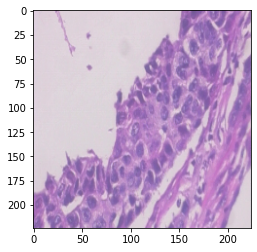

In [25]:
plt.imshow(X_train[0])

In [26]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 64
EPOCHS = 200

In [27]:
val_samples = 2000
x_val, y_val = X_train[:val_samples], Y_train[:val_samples]
new_x_train, new_y_train = X_train[val_samples:], Y_train[val_samples:]



In [28]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 64
EPOCHS = 10

val_samples = 2000
x_val, y_val = X_train[:val_samples], Y_train[:val_samples]
new_x_train, new_y_train = X_train[val_samples:], Y_train[val_samples:]



In [29]:
BATCH_SIZE = 16

train_generator = ImageDataGenerator(
        zoom_range=2,  # set range for random zoom
        rotation_range = 90,
        horizontal_flip=True,  # randomly flip images
        vertical_flip=True,  # randomly flip images
        shear_range=0.7,
        brightness_range=[0.2,0.6]
    )

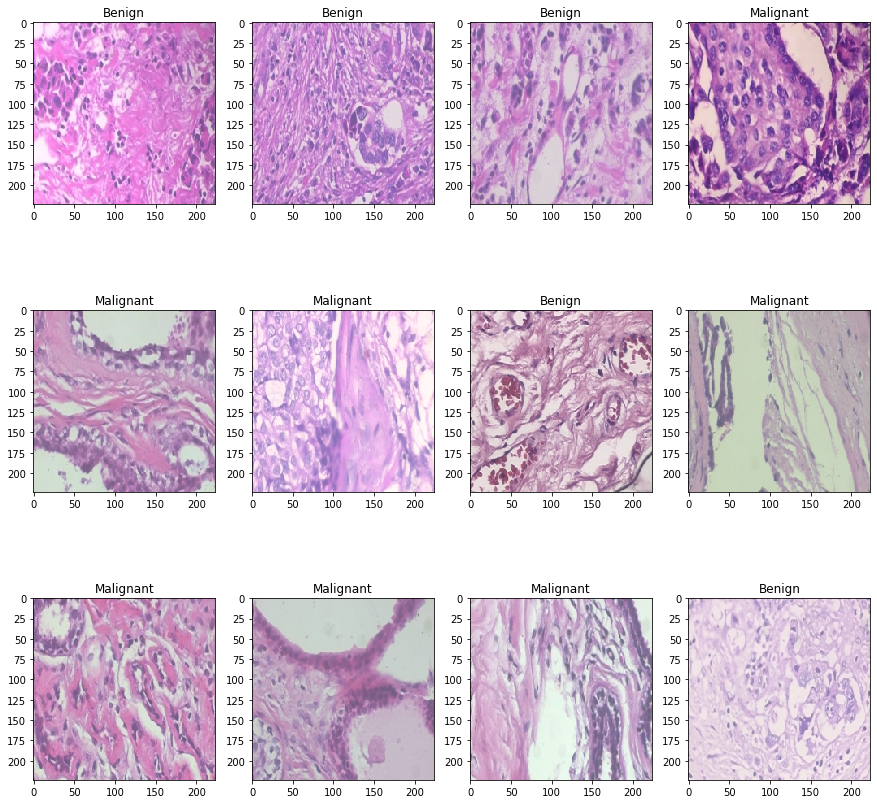

In [30]:
x_train, x_val, y_train, y_val = train_test_split(
    X_train, Y_train, 
    test_size=0.2, 
    random_state=11
)

w=60
h=40
fig=plt.figure(figsize=(15, 15))
columns = 4
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    if np.argmax(Y_train[i]) == 0:
        ax.title.set_text('Benign')
    else:
        ax.title.set_text('Malignant')
    plt.imshow(x_train[i], interpolation='nearest')
plt.show()

# Convolutional Neural Network

In [31]:
def build_model(backbone, lr=1e-4):
    model = Sequential()
    model.add(backbone)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(2, activation='softmax'))
    
    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(lr=lr),
        metrics=['accuracy']
    )
    return model

resnet = DenseNet201(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

model = build_model(resnet ,lr = 1e-4)
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet201 (Functional)     (None, 7, 7, 1920)        18321984  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1920)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1920)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 1920)              7680      
_________________________________________________________________
dense (Dense)                (None, 2)                 3842      
Total params: 18,333,506
Trainable params: 18,100,610
Non-trainable params: 232,896
_________________________________________________________________


/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [32]:
learn_control = ReduceLROnPlateau(monitor='val_acc', patience=5,
                                  verbose=1,factor=0.2, min_lr=1e-7)

filepath="weights.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

history = model.fit_generator(
    train_generator.flow(x_train, y_train, batch_size=BATCH_SIZE),
    steps_per_epoch=x_train.shape[0] / BATCH_SIZE,
    epochs=10,
    validation_data=(x_val, y_val),
    callbacks=[learn_control, checkpoint]
)

/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
67/67 [==============================] - 556s 8s/step - loss: 0.5824 - accuracy: 0.7393 - val_loss: 0.3748 - val_accuracy: 0.8667
Epoch 2/10
67/67 [==============================] - 538s 8s/step - loss: 0.4216 - accuracy: 0.8377 - val_loss: 0.3320 - val_accuracy: 0.8926
Epoch 3/10
67/67 [==============================] - 560s 8s/step - loss: 0.3674 - accuracy: 0.8655 - val_loss: 0.2883 - val_accuracy: 0.8815
Epoch 4/10
67/67 [==============================] - 552s 8s/step - loss: 0.3392 - accuracy: 0.8822 - val_loss: 0.3840 - val_accuracy: 0.8111
Epoch 5/10
67/67 [==============================] - 540s 8s/step - loss: 0.3385 - accuracy: 0.8655 - val_loss: 0.4385 - val_accuracy: 0.8259
Epoch 6/10
67/67 [==============================] - 553s 8s/step - loss: 0.3134 - accuracy: 0.8785 - val_loss: 0.2348 - val_accuracy: 0.9111
Epoch 7/10
67/67 [==============================] - 554s 8s/step - loss: 0.2794 - accuracy: 0.8859 - val_loss: 0.4230 - val_accuracy: 0.8037
Epoch 8/10
67

<AxesSubplot:>

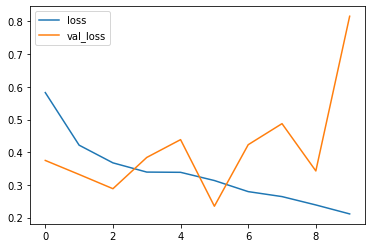

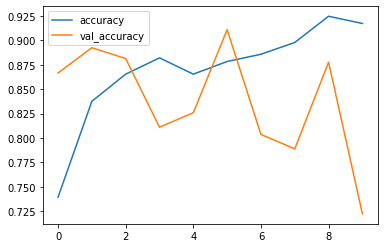

In [34]:
history_df = pd.DataFrame(history.history)
history_df[['loss', 'val_loss']].plot()

history_df = pd.DataFrame(history.history)
history_df[['accuracy', 'val_accuracy']].plot()

In [35]:
y_pred=model.predict(X_test)

In [36]:
from sklearn.metrics import classification_report
classification_report( np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))



'              precision    recall  f1-score   support\n\n           0       0.81      0.13      0.22       222\n           1       0.69      0.98      0.81       443\n\n    accuracy                           0.70       665\n   macro avg       0.75      0.56      0.52       665\nweighted avg       0.73      0.70      0.62       665\n'

In [72]:

print(classification_report( np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1)))

              precision    recall  f1-score   support

           0       0.97      0.80      0.87       192
           1       0.91      0.99      0.95       409

    accuracy                           0.93       601
   macro avg       0.94      0.89      0.91       601
weighted avg       0.93      0.93      0.92       601



Confusion matrix, without normalization
[[ 29 193]
 [  7 436]]


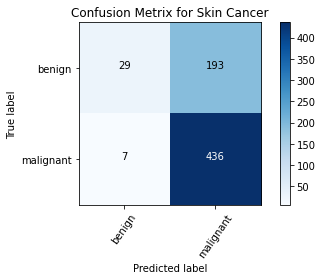

In [38]:

from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=55)
    plt.yticks(tick_marks, classes)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

cm = confusion_matrix(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))

cm_plot_label =['benign', 'malignant']
plot_confusion_matrix(cm, cm_plot_label, title ='Confusion Metrix for Skin Cancer')

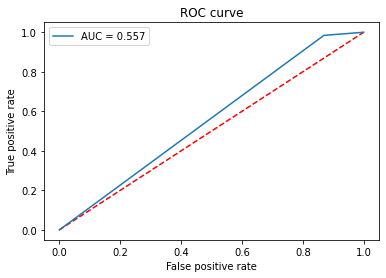

In [39]:
from sklearn.metrics import roc_auc_score, auc
from sklearn.metrics import roc_curve
roc_log = roc_auc_score(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
false_positive_rate, true_positive_rate, threshold = roc_curve(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
area_under_curve = auc(false_positive_rate, true_positive_rate)

plt.plot([0, 1], [0, 1], 'r--')
plt.plot(false_positive_rate, true_positive_rate, label='AUC = {:.3f}'.format(area_under_curve))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()
#plt.savefig(ROC_PLOT_FILE, bbox_inches='tight')
plt.close()

In [40]:
from tensorflow import keras

In [41]:
model.save('/Users/ssing623/Documents/B Cancer/model_200X')

INFO:tensorflow:Assets written to: /Users/ssing623/Documents/B Cancer/model_200X/assets


# Model on 400 X

In [42]:
import os
os.chdir('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast')

In [43]:
!ls

DCGAN_generated_output count_files.sh         malignant
README.txt             initial_weights.h5
benign                 logs


In [44]:
def Dataset_loader(DIR, RESIZE, sigmaX=200):
    IMG = []
    read = lambda imname: np.asarray(Image.open(imname).convert("RGB"))
    for IMAGE_NAME in tqdm(os.listdir(DIR)):
        PATH = os.path.join(DIR,IMAGE_NAME)
        _, ftype = os.path.splitext(PATH)
        if ftype == ".png":
            img = read(PATH)
           
            img = cv2.resize(img, (RESIZE,RESIZE))
           
            IMG.append(np.array(img))
    return IMG

In [45]:
path=os.walk('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB')

In [46]:
benign=[]
for root,directories, files in path:
    
    for directory in directories:
        if directory=='400X':
            benign.append(np.array(Dataset_loader(root+'/'+directory,224)))
            print(root+'/'+directory)

 21%|██        | 6/29 [00:00<00:00, 52.72it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/400X


 20%|██        | 6/30 [00:00<00:00, 53.91it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549G/400X


 41%|████      | 7/17 [00:00<00:00, 63.06it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549CD/400X


 21%|██        | 6/29 [00:00<00:00, 54.53it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-29960CD/400X


 29%|██▉       | 7/24 [00:00<00:00, 61.69it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184CD/400X


 53%|█████▎    | 8/15 [00:00<00:00, 69.92it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-16184/400X


  0%|          | 0/14 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-13200/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-15275/400X


 53%|█████▎    | 9/17 [00:00<00:00, 84.94it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-21978AB/400X


 50%|█████     | 8/16 [00:00<00:00, 73.48it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-3411F/400X


 53%|█████▎    | 9/17 [00:00<00:00, 81.22it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/tubular_adenoma/SOB_B_TA_14-19854C/400X


 44%|████▍     | 8/18 [00:00<00:00, 77.08it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-29960AB/400X


 16%|█▌        | 6/37 [00:00<00:00, 53.48it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23222AB/400X


 27%|██▋       | 7/26 [00:00<00:00, 63.81it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134/400X


  0%|          | 0/32 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-9133/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060CD/400X


 18%|█▊        | 6/33 [00:00<00:00, 57.21it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998CD/400X


 21%|██▏       | 6/28 [00:00<00:00, 55.91it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-25197/400X


 50%|█████     | 6/12 [00:00<00:00, 54.99it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-21998EF/400X


 50%|█████     | 9/18 [00:00<00:00, 80.66it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-14134E/400X


 15%|█▌        | 6/39 [00:00<00:00, 56.57it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/fibroadenoma/SOB_B_F_14-23060AB/400X


 10%|█         | 6/59 [00:00<00:00, 59.07it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-22704/400X


 35%|███▌      | 6/17 [00:00<00:00, 59.71it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-21998AB/400X


100%|██████████| 17/17 [00:00<00:00, 61.54it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/benign/SOB/phyllodes_tumor/SOB_B_PT_14-29315EF/400X


In [47]:
benign_final=np.array(list(itertools.chain.from_iterable(benign)))

In [48]:
benign_final.shape

(588, 224, 224, 3)

In [49]:
path=os.walk('/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB')

In [50]:
malignant=[]
for root,directories, files in path:
    
    for directory in directories:
        if directory=='400X':
            malignant.append(np.array(Dataset_loader(root+'/'+directory,224)))
            print(root+'/'+directory)

 17%|█▋        | 6/35 [00:00<00:00, 56.24it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13418DE/400X


 33%|███▎      | 6/18 [00:00<00:00, 53.94it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-16456/400X


  0%|          | 0/9 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-12773/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979C/400X


  0%|          | 0/26 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-18842D/400X


 29%|██▉       | 7/24 [00:00<00:00, 64.96it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13413/400X


  0%|          | 0/15 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-19979/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-10147/400X


 23%|██▎       | 8/35 [00:00<00:00, 72.86it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_15-190EF/400X


 19%|█▉        | 7/36 [00:00<00:00, 65.46it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15704/400X


 46%|████▌     | 6/13 [00:00<00:00, 58.45it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-19440/400X


  0%|          | 0/24 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-12465/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-15687B/400X


 30%|███       | 6/20 [00:00<00:00, 53.34it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/papillary_carcinoma/SOB_M_PC_14-9146/400X


  0%|          | 0/38 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11951/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-8168/400X


 47%|████▋     | 7/15 [00:00<00:00, 63.40it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-12312/400X


 30%|███       | 7/23 [00:00<00:00, 62.01it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15792/400X


 50%|█████     | 7/14 [00:00<00:00, 59.72it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16188/400X


 44%|████▍     | 7/16 [00:00<00:00, 68.86it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2985/400X


 29%|██▊       | 8/28 [00:00<00:00, 74.45it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17915/400X


 38%|███▊      | 6/16 [00:00<00:00, 56.79it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17901/400X


  0%|          | 0/15 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14926/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16875/400X


 40%|████      | 6/15 [00:00<00:00, 57.14it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15696/400X


  0%|          | 0/29 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16448/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-10926/400X


 27%|██▋       | 6/22 [00:00<00:00, 55.36it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-18650/400X


 25%|██▌       | 6/24 [00:00<00:00, 58.40it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20636/400X


  0%|          | 0/14 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4372/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16336/400X


 31%|███       | 8/26 [00:00<00:00, 68.65it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-3909/400X


  0%|          | 0/23 [00:00<?, ?it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13412/400X
/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-4364/400X


 25%|██▌       | 6/24 [00:00<00:00, 56.27it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5287/400X


 24%|██▍       | 7/29 [00:00<00:00, 66.81it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-20629/400X


 30%|███       | 6/20 [00:00<00:00, 55.51it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16716/400X


 54%|█████▍    | 7/13 [00:00<00:00, 60.07it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14015/400X


 25%|██▌       | 6/24 [00:00<00:00, 55.44it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16601/400X


 16%|█▌        | 6/38 [00:00<00:00, 59.01it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2523/400X


 39%|███▉      | 7/18 [00:00<00:00, 66.06it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2773/400X


 53%|█████▎    | 8/15 [00:00<00:00, 71.05it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-2980/400X


 25%|██▌       | 8/32 [00:00<00:00, 75.51it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11031/400X


 21%|██        | 7/34 [00:00<00:00, 61.63it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-13993/400X


 40%|████      | 6/15 [00:00<00:00, 57.07it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14946/400X


 23%|██▎       | 6/26 [00:00<00:00, 53.69it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15572/400X


 46%|████▌     | 6/13 [00:00<00:00, 55.19it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5694/400X


 26%|██▌       | 6/23 [00:00<00:00, 59.03it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-6241/400X


 29%|██▉       | 7/24 [00:00<00:00, 61.90it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-11520/400X


 21%|██▏       | 6/28 [00:00<00:00, 55.46it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5695/400X


 23%|██▎       | 7/31 [00:00<00:00, 67.83it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-17614/400X


 41%|████      | 7/17 [00:00<00:00, 65.80it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-9461/400X


 27%|██▋       | 7/26 [00:00<00:00, 63.02it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-16196/400X


 17%|█▋        | 7/41 [00:00<00:00, 61.51it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-13412/400X


 21%|██        | 6/29 [00:00<00:00, 58.55it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570/400X


 25%|██▌       | 6/24 [00:00<00:00, 56.45it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570C/400X


100%|██████████| 24/24 [00:00<00:00, 60.83it/s]

/Users/ssing623/Documents/B Cancer/BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-12204/400X


In [51]:
malignant_final=np.array(list(itertools.chain.from_iterable(malignant)))

In [52]:
malignant_final.shape

(1232, 224, 224, 3)

In [53]:
benign_label = np.zeros(len(benign_final))
malign_label = np.ones(len(malignant_final))

In [54]:
X=np.concatenate((benign_final, malignant_final), axis = 0)

In [55]:
Y=np.concatenate((benign_label, malign_label), axis = 0)

In [56]:
from sklearn.model_selection import train_test_split

In [57]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

In [58]:
pd.DataFrame(Y_test)[0].value_counts()

1.0    409
0.0    192
Name: 0, dtype: int64

In [59]:
pd.DataFrame(Y_train)[0].value_counts()

1.0    823
0.0    396
Name: 0, dtype: int64

In [60]:
s = np.arange(X_train.shape[0])
np.random.shuffle(s)
X_train = X_train[s]
Y_train = Y_train[s]

s = np.arange(X_test.shape[0])
np.random.shuffle(s)
X_test = X_test[s]
Y_test = Y_test[s]

Y_train = to_categorical(Y_train, num_classes= 2)
Y_test = to_categorical(Y_test, num_classes= 2)

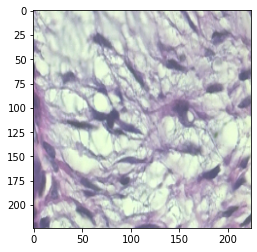

In [61]:
plt.imshow(X_train[0])

In [62]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 64
EPOCHS = 200

In [63]:
val_samples = 2000
x_val, y_val = X_train[:val_samples], Y_train[:val_samples]
new_x_train, new_y_train = X_train[val_samples:], Y_train[val_samples:]



In [64]:
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 64
EPOCHS = 10

val_samples = 2000
x_val, y_val = X_train[:val_samples], Y_train[:val_samples]
new_x_train, new_y_train = X_train[val_samples:], Y_train[val_samples:]



In [65]:
BATCH_SIZE = 16

train_generator = ImageDataGenerator(
        zoom_range=2,  # set range for random zoom
        rotation_range = 90,
        horizontal_flip=True,  # randomly flip images
        vertical_flip=True,  # randomly flip images
        shear_range=0.7,
        brightness_range=[0.2,0.6]
    )

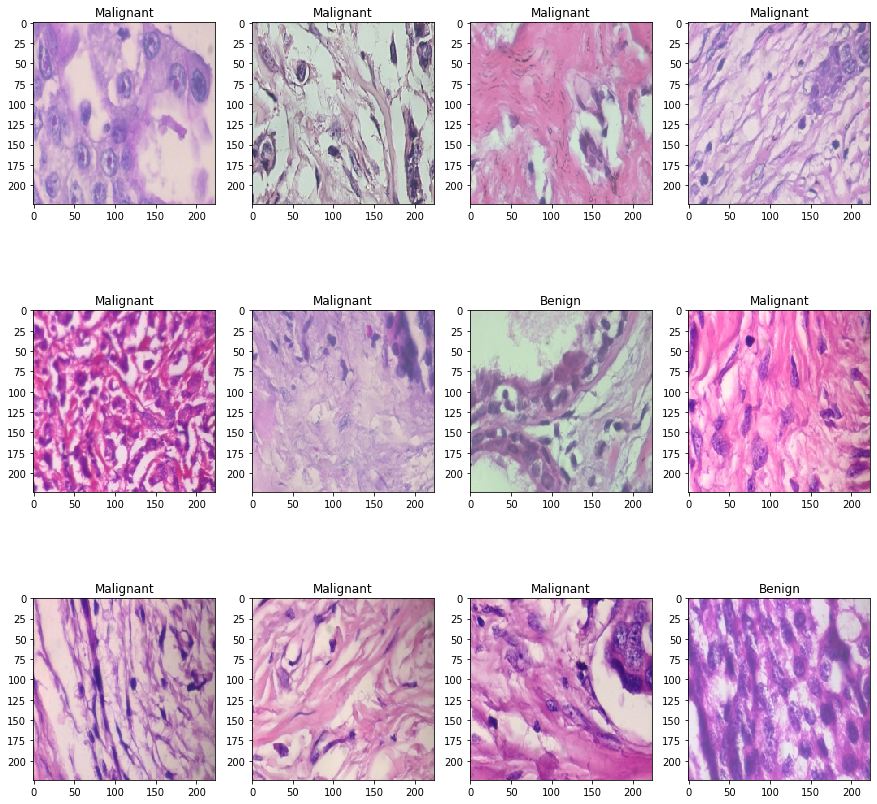

In [66]:
x_train, x_val, y_train, y_val = train_test_split(
    X_train, Y_train, 
    test_size=0.2, 
    random_state=11
)

w=60
h=40
fig=plt.figure(figsize=(15, 15))
columns = 4
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    if np.argmax(Y_train[i]) == 0:
        ax.title.set_text('Benign')
    else:
        ax.title.set_text('Malignant')
    plt.imshow(x_train[i], interpolation='nearest')
plt.show()

# Convolutional Neural Network

In [67]:
def build_model(backbone, lr=1e-4):
    model = Sequential()
    model.add(backbone)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(2, activation='softmax'))
    
    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(lr=lr),
        metrics=['accuracy']
    )
    return model

resnet = DenseNet201(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

model = build_model(resnet ,lr = 1e-4)
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet201 (Functional)     (None, 7, 7, 1920)        18321984  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 1920)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1920)              0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 1920)              7680      
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 3842      
Total params: 18,333,506
Trainable params: 18,100,610
Non-trainable params: 232,896
_________________________________________________________________


/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [68]:
learn_control = ReduceLROnPlateau(monitor='val_acc', patience=5,
                                  verbose=1,factor=0.2, min_lr=1e-7)

filepath="weights.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')

history = model.fit_generator(
    train_generator.flow(x_train, y_train, batch_size=BATCH_SIZE),
    steps_per_epoch=x_train.shape[0] / BATCH_SIZE,
    epochs=10,
    validation_data=(x_val, y_val),
    callbacks=[learn_control, checkpoint]
)

/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
60/60 [==============================] - 538s 9s/step - loss: 0.6082 - accuracy: 0.6944 - val_loss: 0.6265 - val_accuracy: 0.6967
Epoch 2/10
60/60 [==============================] - 505s 8s/step - loss: 0.4835 - accuracy: 0.8051 - val_loss: 0.3645 - val_accuracy: 0.8607
Epoch 3/10
60/60 [==============================] - 493s 8s/step - loss: 0.4032 - accuracy: 0.8451 - val_loss: 0.4834 - val_accuracy: 0.8566
Epoch 4/10
60/60 [==============================] - 1326s 22s/step - loss: 0.3593 - accuracy: 0.8626 - val_loss: 0.4462 - val_accuracy: 0.8320
Epoch 5/10
60/60 [==============================] - 538s 9s/step - loss: 0.3391 - accuracy: 0.8667 - val_loss: 0.5558 - val_accuracy: 0.8730
Epoch 6/10
60/60 [==============================] - 650s 11s/step - loss: 0.3159 - accuracy: 0.8759 - val_loss: 0.2377 - val_accuracy: 0.9139
Epoch 7/10
60/60 [==============================] - 562s 9s/step - loss: 0.3189 - accuracy: 0.8954 - val_loss: 0.6232 - val_accuracy: 0.7828
Epoch 8/10

<AxesSubplot:>

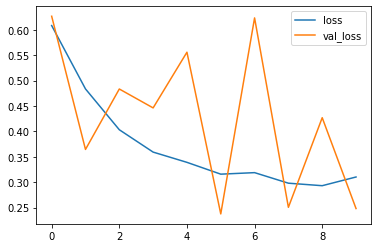

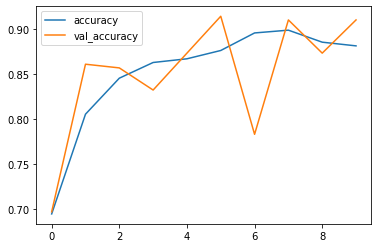

In [69]:
history_df = pd.DataFrame(history.history)
history_df[['loss', 'val_loss']].plot()

history_df = pd.DataFrame(history.history)
history_df[['accuracy', 'val_accuracy']].plot()

In [70]:
y_pred=model.predict(X_test)

In [71]:
from sklearn.metrics import classification_report
classification_report( np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))



'              precision    recall  f1-score   support\n\n           0       0.97      0.80      0.87       192\n           1       0.91      0.99      0.95       409\n\n    accuracy                           0.93       601\n   macro avg       0.94      0.89      0.91       601\nweighted avg       0.93      0.93      0.92       601\n'

In [72]:

print(classification_report( np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1)))

              precision    recall  f1-score   support

           0       0.97      0.80      0.87       192
           1       0.91      0.99      0.95       409

    accuracy                           0.93       601
   macro avg       0.94      0.89      0.91       601
weighted avg       0.93      0.93      0.92       601



Confusion matrix, without normalization
[[153  39]
 [  5 404]]


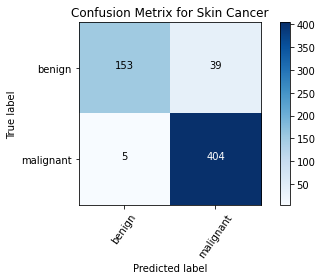

In [73]:

from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=55)
    plt.yticks(tick_marks, classes)
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

cm = confusion_matrix(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))

cm_plot_label =['benign', 'malignant']
plot_confusion_matrix(cm, cm_plot_label, title ='Confusion Metrix for Skin Cancer')

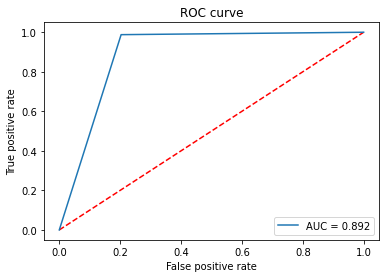

In [74]:
from sklearn.metrics import roc_auc_score, auc
from sklearn.metrics import roc_curve
roc_log = roc_auc_score(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
false_positive_rate, true_positive_rate, threshold = roc_curve(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))
area_under_curve = auc(false_positive_rate, true_positive_rate)

plt.plot([0, 1], [0, 1], 'r--')
plt.plot(false_positive_rate, true_positive_rate, label='AUC = {:.3f}'.format(area_under_curve))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()
#plt.savefig(ROC_PLOT_FILE, bbox_inches='tight')
plt.close()

In [75]:
from tensorflow import keras

In [76]:
model.save('/Users/ssing623/Documents/B Cancer/model_400X')

INFO:tensorflow:Assets written to: /Users/ssing623/Documents/B Cancer/model_400X/assets


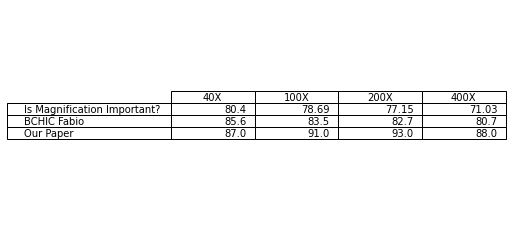

In [81]:
import pandas as pd
import matplotlib.pyplot as plt

fig, ax =plt.subplots(1,1)
data=[[80.40, 78.69, 77.15, 71.03],
      [85.6,83.5,82.7,80.7],
      [87,91,93,88]]
column_labels=["40X", "100X", "200X","400X"]
df=pd.DataFrame(data,columns=column_labels)
ax.axis('tight')
ax.axis('off')
ax.table(cellText=df.values,colLabels=df.columns,rowLabels=["Is Magnification Important?","BCHIC Fabio",'Our Paper'],loc="center")

plt.show()